In [1]:
%matplotlib inline
from preamble import *

## 2. Supervised Learning
### 2.1 Classification and Regression

### 2.2 Generalization, Overfitting and Underfitting

<img src="images/overfitting_underfitting_cartoon.png" alt="model_complexity" style="width: 50%;"/>

#### 2.2.1 Relation of Model Complexity to Dataset Size

### 2.3 Supervised Machine Learning Algorithms
#### 2.3.1 Some Sample Datasets

- forge 데이터셋

X.shape: (26, 2)
X:
[[  9.963   4.597]
 [ 11.033  -0.168]
 [ 11.542   5.211]
 [  8.693   1.543]
 [  8.106   4.287]
 [  8.31    4.806]
 [ 11.93    4.649]
 [  9.673  -0.203]
 [  8.348   5.134]
 [  8.675   4.476]
 [  9.177   5.093]
 [ 10.24    2.455]
 [  8.689   1.487]
 [  8.922  -0.64 ]
 [  9.491   4.332]
 [  9.257   5.133]
 [  7.998   4.853]
 [  8.184   1.296]
 [  8.734   2.492]
 [  9.323   5.098]
 [ 10.064   0.991]
 [  9.5    -0.264]
 [  8.345   1.638]
 [  9.502   1.938]
 [  9.151   5.498]
 [ 11.564   1.339]]
y.shape: (26,)
y:
[1 0 1 0 0 1 1 0 1 1 1 1 0 0 1 1 1 0 0 1 0 0 0 0 1 0]


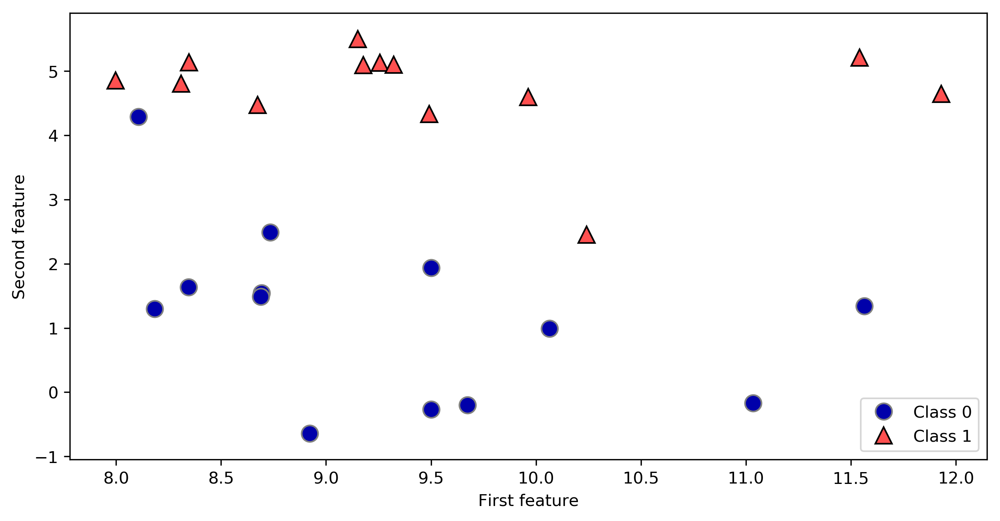

In [2]:
# generate dataset
X, y = mglearn.datasets.make_forge()
print("X.shape: {}".format(X.shape))
print("X:\n{}".format(X))
print("y.shape: {}".format(y.shape))
print("y:\n{}".format(y))

# plot dataset
plt.figure(figsize=(10, 5))
mglearn.discrete_scatter(X[:, 0], X[:, 1], y)
plt.legend(["Class 0", "Class 1"], loc=4)
plt.xlabel("First feature")
plt.ylabel("Second feature")
plt.show()

- wave 데이터셋

X.shape: (40, 1)
X:
[[-0.753]
 [ 2.704]
 [ 1.392]
 [ 0.592]
 [-2.064]
 [-2.064]
 [-2.651]
 [ 2.197]
 [ 0.607]
 [ 1.248]
 [-2.876]
 [ 2.819]
 [ 1.995]
 [-1.726]
 [-1.909]
 [-1.9  ]
 [-1.175]
 [ 0.149]
 [-0.408]
 [-1.253]
 [ 0.671]
 [-2.163]
 [-1.247]
 [-0.802]
 [-0.264]
 [ 1.711]
 [-1.802]
 [ 0.085]
 [ 0.554]
 [-2.721]
 [ 0.645]
 [-1.977]
 [-2.61 ]
 [ 2.693]
 [ 2.794]
 [ 1.85 ]
 [-1.172]
 [-2.414]
 [ 1.105]
 [-0.359]]
y.shape: (40,)
y:
[-0.448  0.331  0.779  0.035 -1.388 -2.472 -1.527  1.494  1.     0.23  -1.06
  0.779  0.754 -1.514 -1.673 -0.905  0.084 -0.527 -0.541 -0.341  0.218
 -1.125  0.373  0.098 -0.986  0.967 -1.135  0.698  0.437 -0.957  0.035
 -2.086 -0.474  1.537  0.869  1.877  0.095 -1.415  0.254  0.094]


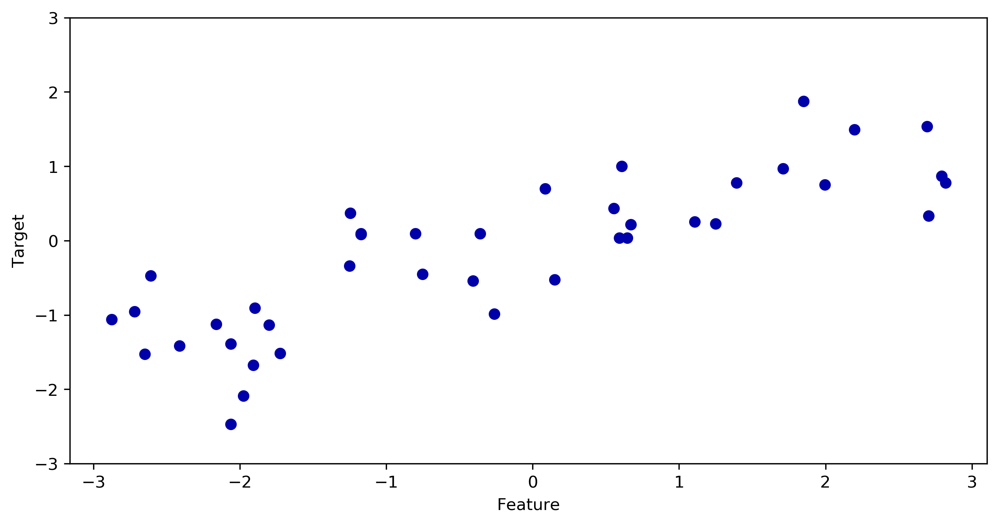

In [3]:
X, y = mglearn.datasets.make_wave(n_samples=40)
print("X.shape: {}".format(X.shape))
print("X:\n{}".format(X))
print("y.shape: {}".format(y.shape))
print("y:\n{}".format(y))

plt.figure(figsize=(10, 5))
plt.plot(X, y, 'o')
plt.ylim(-3, 3)
plt.xlabel("Feature")
plt.ylabel("Target")
plt.show()

- Wisconsin Breast Cancer 데이터셋

In [4]:
from sklearn.datasets import load_breast_cancer
cancer = load_breast_cancer()
print("cancer.keys(): {}".format(cancer.keys()))

cancer.keys(): dict_keys(['data', 'target', 'target_names', 'DESCR', 'feature_names'])


In [5]:
print("Shape of cancer data: {}".format(cancer.data.shape))

Shape of cancer data: (569, 30)


In [6]:
print("Sample counts per class:\n{}".format(
      {n: v for n, v in zip(cancer.target_names, np.bincount(cancer.target))}
))

Sample counts per class:
{'malignant': 212, 'benign': 357}


In [7]:
print("Feature names:\n{}".format(cancer.feature_names))

Feature names:
['mean radius' 'mean texture' 'mean perimeter' 'mean area'
 'mean smoothness' 'mean compactness' 'mean concavity'
 'mean concave points' 'mean symmetry' 'mean fractal dimension'
 'radius error' 'texture error' 'perimeter error' 'area error'
 'smoothness error' 'compactness error' 'concavity error'
 'concave points error' 'symmetry error' 'fractal dimension error'
 'worst radius' 'worst texture' 'worst perimeter' 'worst area'
 'worst smoothness' 'worst compactness' 'worst concavity'
 'worst concave points' 'worst symmetry' 'worst fractal dimension']


- Boston Housing 데이터셋

In [8]:
from sklearn.datasets import load_boston
boston = load_boston()
print("boston.keys(): {}".format(boston.keys()))

boston.keys(): dict_keys(['data', 'target', 'feature_names', 'DESCR'])


In [9]:
print("Feature Names: {}".format(boston.feature_names))
print("Feature Names: {}".format(boston.DESCR))

Feature Names: ['CRIM' 'ZN' 'INDUS' 'CHAS' 'NOX' 'RM' 'AGE' 'DIS' 'RAD' 'TAX' 'PTRATIO'
 'B' 'LSTAT']
Feature Names: Boston House Prices dataset

Notes
------
Data Set Characteristics:  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive
    
    :Median Value (attribute 14) is usually the target

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highw

In [10]:
print("Data shape: {}".format(boston.data.shape))
print("Target shape: {}".format(boston.target.shape))

Data shape: (506, 13)
Target shape: (506,)


In [11]:
X, y = mglearn.datasets.load_extended_boston()
print("X.shape: {}".format(X.shape))

X.shape: (506, 104)


### 2.3.2 k-Nearest Neighbor
#### k-Neighbors Classification

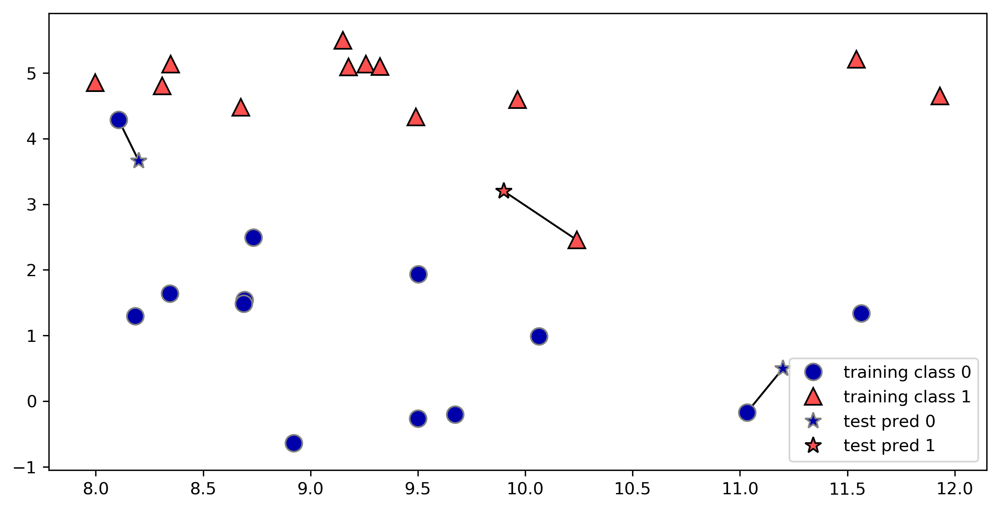

In [12]:
plt.figure(figsize=(10, 5))
mglearn.plots.plot_knn_classification(n_neighbors=1)

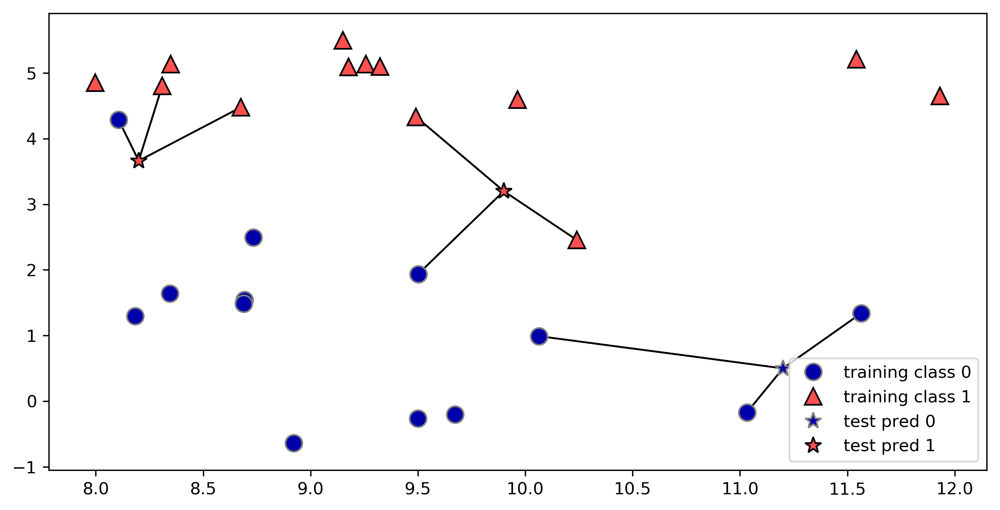

In [13]:
plt.figure(figsize=(10, 5))
mglearn.plots.plot_knn_classification(n_neighbors=3)

In [14]:
from sklearn.model_selection import train_test_split
# X --> (26, 2)
# Y --> (26,)
X, y = mglearn.datasets.make_forge()

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)
print("X_train shape: {}".format(X_train.shape))
print("y_train shape: {}".format(y_train.shape))

print()

print("X_test shape: {}".format(X_test.shape))
print("y_test shape: {}".format(y_test.shape))

X_train shape: (19, 2)
y_train shape: (19,)

X_test shape: (7, 2)
y_test shape: (7,)


In [15]:
from sklearn.neighbors import KNeighborsClassifier
clf = KNeighborsClassifier(n_neighbors=3)

In [16]:
clf.fit(X_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=3, p=2,
           weights='uniform')

In [17]:
print("Test set predictions: {}".format(clf.predict(X_test)))

Test set predictions: [1 0 1 0 1 0 0]


In [18]:
print("Test set accuracy: {:.2f}".format(clf.score(X_test, y_test)))

Test set accuracy: 0.86


- clf.score() outputs 'R²' score
  - 1.0 : Perfect Prediction
  - 0.0 : Prediction to the mean of the given y values 
  - $R^2 = 1 - {\frac{RSS}{TSS}}$
    - RSS is the residual sum of squares $∑(y - f(x))²$
    - TSS is the total sum of squares $∑(y - mean(y))²$.

#### Analyzing KNeighborsClassifier

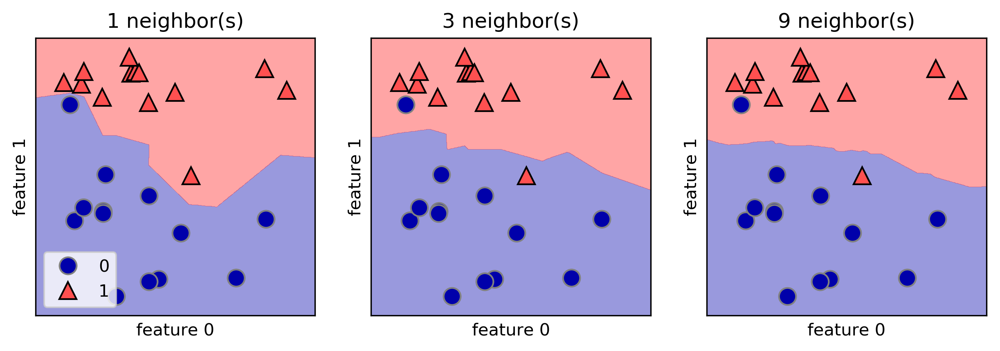

In [19]:
fig, axes = plt.subplots(1, 3, figsize=(10, 3))

for n_neighbors, ax in zip([1, 3, 9], axes):
    # the fit method returns the object self, so we can instantiate
    # and fit in one line:
    clf = KNeighborsClassifier(n_neighbors=n_neighbors).fit(X, y)
    mglearn.plots.plot_2d_separator(clf, X, fill=True, eps=0.5, ax=ax, alpha=.4)
    mglearn.discrete_scatter(X[:, 0], X[:, 1], y, ax=ax)
    ax.set_title("{} neighbor(s)".format(n_neighbors))
    ax.set_xlabel("feature 0")
    ax.set_ylabel("feature 1")
axes[0].legend(loc=3)
plt.show()

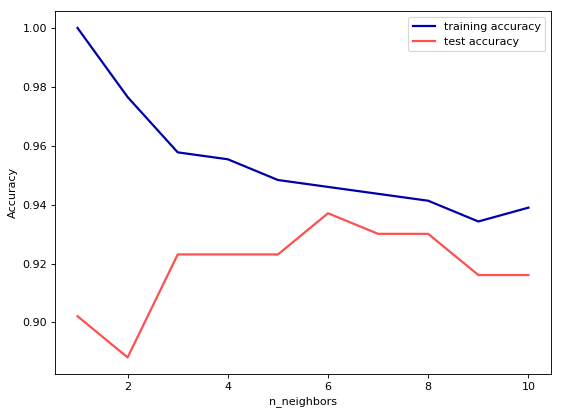

In [20]:
from sklearn.datasets import load_breast_cancer

cancer = load_breast_cancer()
X_train, X_test, y_train, y_test = train_test_split(
    cancer.data, 
    cancer.target, 
    stratify=cancer.target, 
    random_state=66
)

training_accuracy = []
test_accuracy = []
# try n_neighbors from 1 to 10
neighbors_settings = range(1, 11)

for n_neighbors in neighbors_settings:
    # build the model
    clf = KNeighborsClassifier(n_neighbors=n_neighbors)
    clf.fit(X_train, y_train)
    # record training set accuracy
    training_accuracy.append(clf.score(X_train, y_train))
    # record generalization accuracy
    test_accuracy.append(clf.score(X_test, y_test))

plt.figure(figsize=(8, 6), dpi=80, facecolor='w', edgecolor='k')
plt.plot(neighbors_settings, training_accuracy, label="training accuracy")
plt.plot(neighbors_settings, test_accuracy, label="test accuracy")
plt.ylabel("Accuracy")
plt.xlabel("n_neighbors")
plt.legend()
plt.show()

#### k-Neighbors Regression

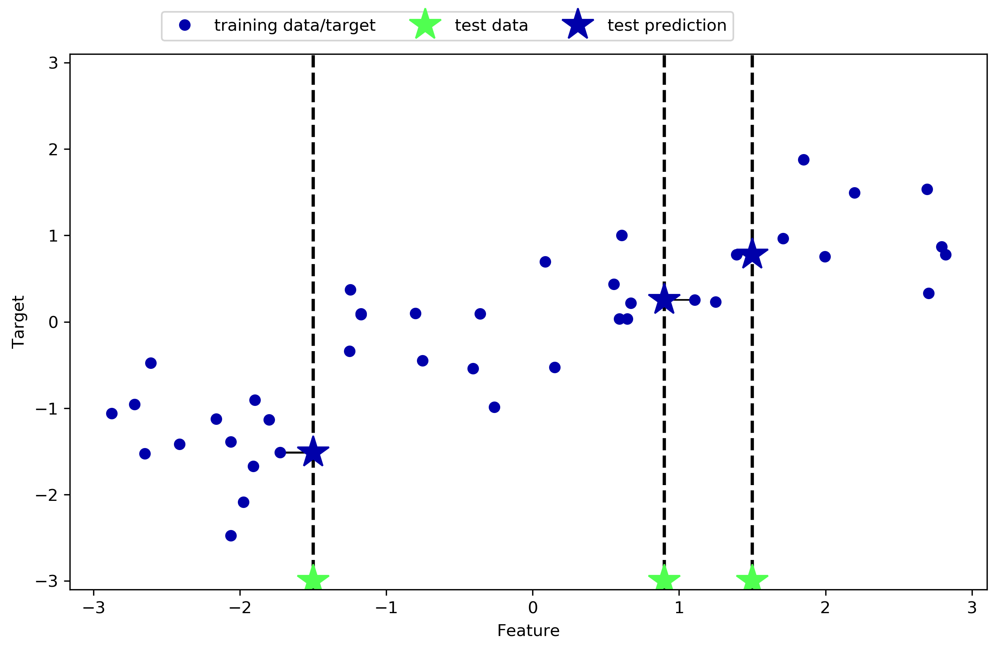

In [21]:
mglearn.plots.plot_knn_regression(n_neighbors=1)

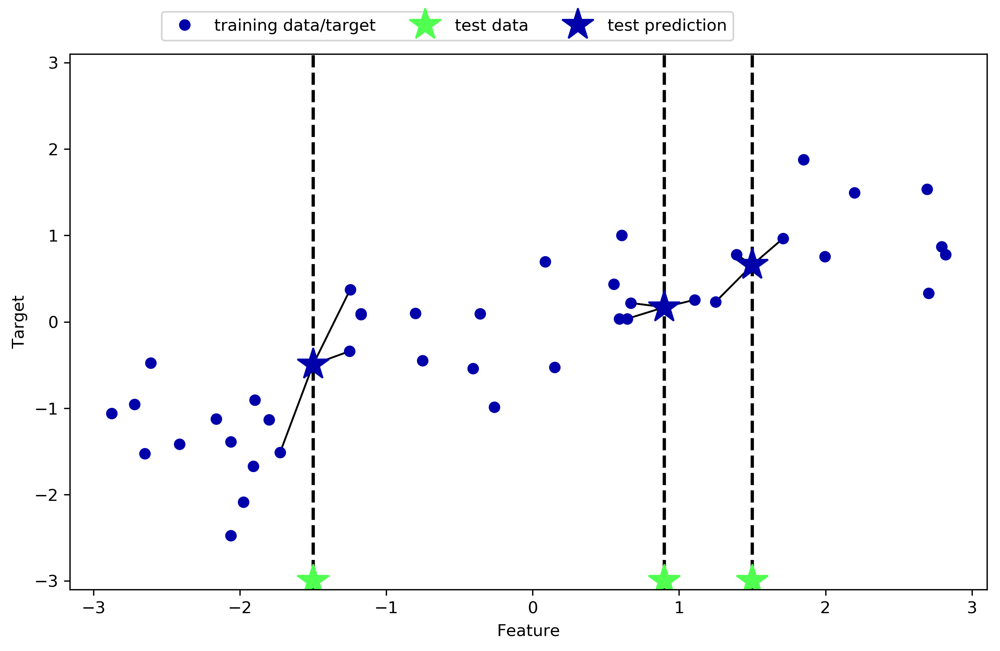

In [22]:
mglearn.plots.plot_knn_regression(n_neighbors=3)

In [23]:
from sklearn.neighbors import KNeighborsRegressor

X, y = mglearn.datasets.make_wave(n_samples=40)

# split the wave dataset into a training and a test set
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

# instantiate the model and set the number of neighbors to consider to 3:
reg = KNeighborsRegressor(n_neighbors=3)
# fit the model using the training data and training targets:
reg.fit(X_train, y_train)

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=1, n_neighbors=3, p=2,
          weights='uniform')

In [24]:
print("Test set predictions:\n{}".format(reg.predict(X_test)))

Test set predictions:
[-0.054  0.357  1.137 -1.894 -1.139 -1.631  0.357  0.912 -0.447 -1.139]


In [25]:
print("Test set R^2: {:.2f}".format(reg.score(X_test, y_test)))

Test set R^2: 0.83


#### Analyzing KNeighborsRegressor

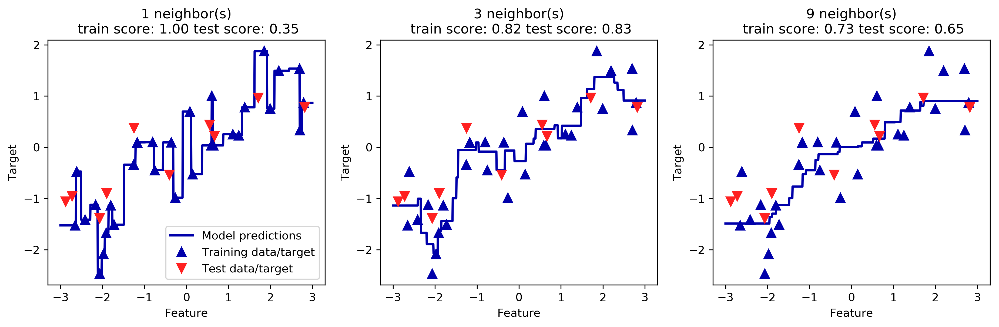

In [26]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
# create 1,000 data points, evenly spaced between -3 and 3
line = np.linspace(-3, 3, 1000).reshape(-1, 1)
for n_neighbors, ax in zip([1, 3, 9], axes):
    # make predictions using 1, 3, or 9 neighbors
    reg = KNeighborsRegressor(n_neighbors=n_neighbors)
    reg.fit(X_train, y_train)
    ax.plot(line, reg.predict(line))
    ax.plot(X_train, y_train, '^', c=mglearn.cm2(0), markersize=8)
    ax.plot(X_test, y_test, 'v', c=mglearn.cm2(1), markersize=8)

    ax.set_title(
        "{} neighbor(s)\n train score: {:.2f} test score: {:.2f}".format(
            n_neighbors, reg.score(X_train, y_train),
            reg.score(X_test, y_test)))
    ax.set_xlabel("Feature")
    ax.set_ylabel("Target")
axes[0].legend(["Model predictions", "Training data/target",
                "Test data/target"], loc="best")

##### Strengths, weaknesses, and parameters
- Strengths
  - 이해하기 쉽다.
  - 많은 조정작업 없어도 좋은 성능을 보임.
  - 더 복잡한 알고리즘을 적용해 보기 전에 시도해볼만한 알고리즘.

- Weaknesses
  - 훈련데이터가 너무 많을 때 성능이 좋지 않음.
  - 수백개 이상의 많은 특성을 지닌 데이터셋에 대해서는 성능이 좋지 않음.
  - 희소 (특성값 대부분이 0) 데이터셋에 대해서도 성능이 좋지 않음.
  - 데이터 전처리 작업이 중요 (3장 참고)

### 2.3.3 Linear Models
#### Linear models for regression

w[0]: 0.393906  b: -0.031804


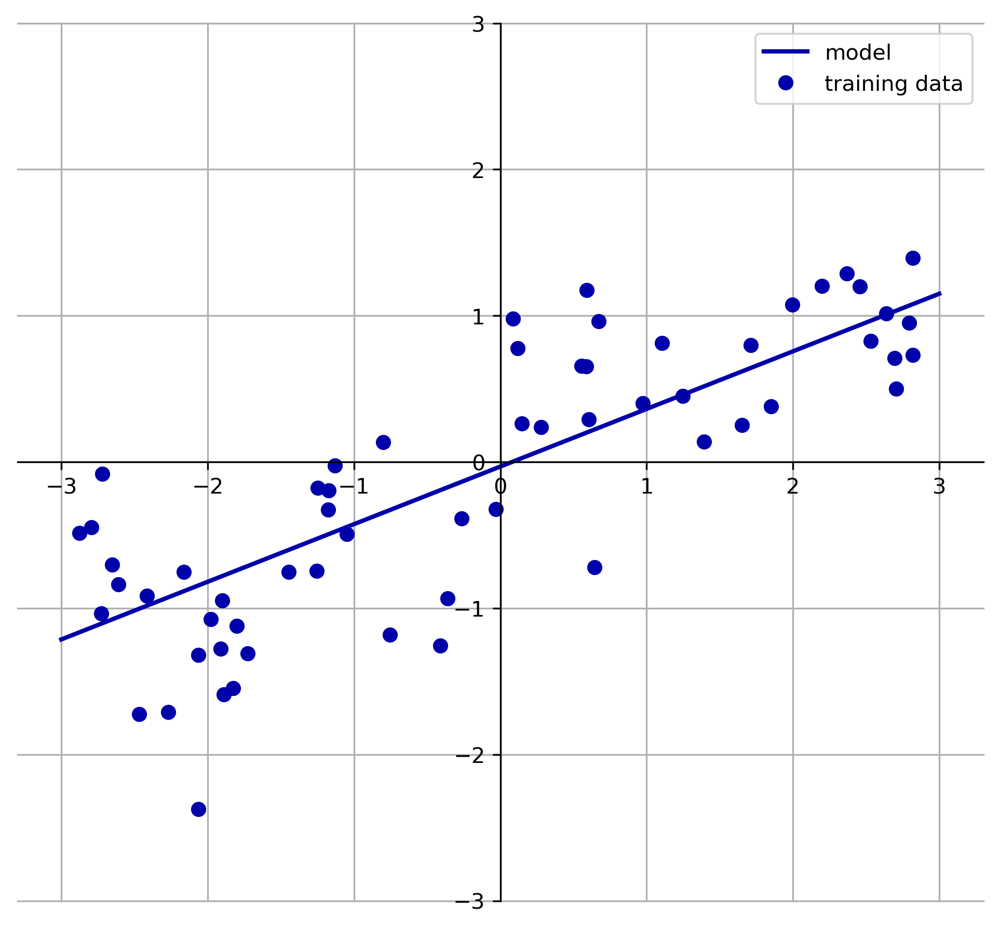

In [27]:
mglearn.plots.plot_linear_regression_wave()

#### Linear Regression (a.k.a. Ordinary Least Squares)
- with wave datasets

In [28]:
from sklearn.linear_model import LinearRegression
X, y = mglearn.datasets.make_wave(n_samples=60)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

lr = LinearRegression().fit(X_train, y_train)

In [29]:
print("lr.coef_: {}".format(lr.coef_))
print("lr.intercept_: {}".format(lr.intercept_))

lr.coef_: [ 0.394]
lr.intercept_: -0.031804343026759746


In [30]:
print("Training set score: {:.2f}".format(lr.score(X_train, y_train)))
print("Test set score: {:.2f}".format(lr.score(X_test, y_test)))

Training set score: 0.67
Test set score: 0.66


- with boston datasets

In [31]:
X, y = mglearn.datasets.load_extended_boston()
print("Data shape: {}".format(X.shape))
print("Target shape: {}".format(y.shape))

Data shape: (506, 104)
Target shape: (506,)


In [32]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)
lr = LinearRegression().fit(X_train, y_train)

In [33]:
print("Training set score: {:.2f}".format(lr.score(X_train, y_train)))
print("Test set score: {:.2f}".format(lr.score(X_test, y_test)))

Training set score: 0.95
Test set score: 0.61


- 위와 같이 훈련데이터 셋에 대해서는 높은 정확도가 나오지만, 테스트데이터 셋에 대해서 낮은 정확도가 나오면 ---> Overfitting!!!
- 단순 평균제곱오차 기반의 단순 선형 회귀 모델로는 이러한 Overfitting 문제를 해결하기 쉽지 않음

##### Ridge regression
- 평균제곱오차 식에 $\alpha \sum_{j=1}^{m} w_{j}^{2}$항이 추가됨
  - 위 항을 L2 Norm 이라고 함.
- 가중치(w)에 대한 L2 규제 (L2 Regularization):
  - 모든 가중치 값들을 가능한 0에 가깝게 되도록 조정 --> 기울기를 작게 만듦 --> 즉, 각각의 특성이 출력에 주는 영향을 최소한으로 만듦
  - alpha: 규제의 강도 조정
     - alpha 값이 커지면 규제가 강화됨
     - alpha 값이 작으면 규제가 약화됨 (alpha = 0 --> 규제가 없음 --> 가중치 값의 자유도가 너무 높게됨 --> Overfitting 발생)

In [34]:
from sklearn.linear_model import Ridge

ridge = Ridge().fit(X_train, y_train)
print("Training set score: {:.2f}".format(ridge.score(X_train, y_train)))
print("Test set score: {:.2f}".format(ridge.score(X_test, y_test)))

Training set score: 0.89
Test set score: 0.75


In [35]:
ridge10 = Ridge(alpha=10).fit(X_train, y_train)
print("Training set score: {:.2f}".format(ridge10.score(X_train, y_train)))
print("Test set score: {:.2f}".format(ridge10.score(X_test, y_test)))

Training set score: 0.79
Test set score: 0.64


In [36]:
ridge01 = Ridge(alpha=0.1).fit(X_train, y_train)
print("Training set score: {:.2f}".format(ridge01.score(X_train, y_train)))
print("Test set score: {:.2f}".format(ridge01.score(X_test, y_test)))

Training set score: 0.93
Test set score: 0.77


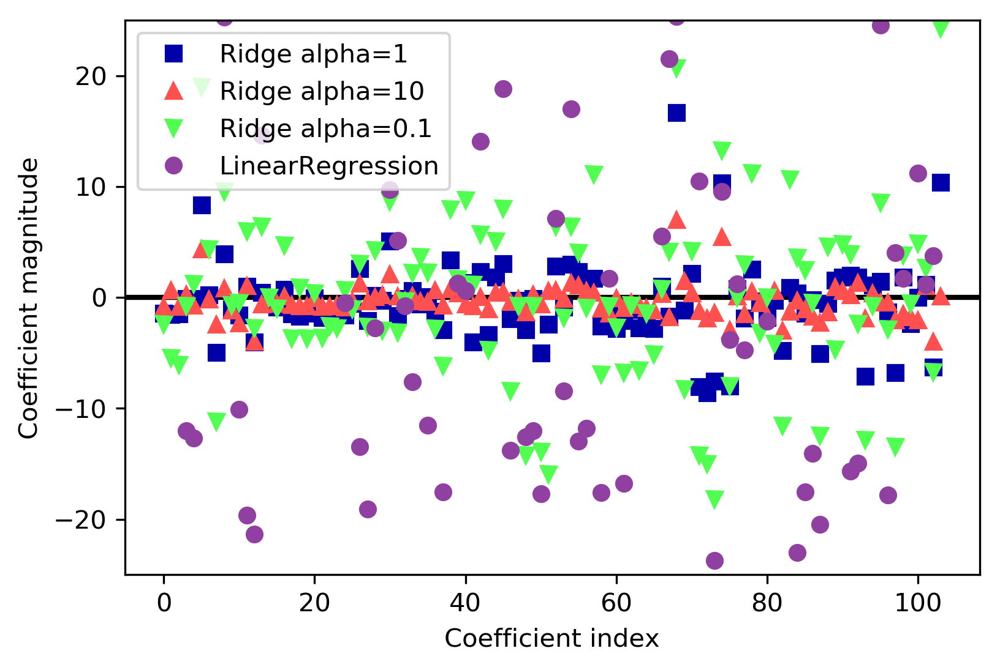

In [37]:
plt.plot(ridge.coef_, 's', label="Ridge alpha=1")
plt.plot(ridge10.coef_, '^', label="Ridge alpha=10")
plt.plot(ridge01.coef_, 'v', label="Ridge alpha=0.1")

plt.plot(lr.coef_, 'o', label="LinearRegression")
plt.xlabel("Coefficient index")
plt.ylabel("Coefficient magnitude")
xlims = plt.xlim()
plt.hlines(0, xlims[0], xlims[1])
plt.xlim(xlims)
plt.ylim(-25, 25)
plt.legend()

##### Lasso
- 평균제곱오차식에 $\alpha \sum_{j=1}^{m} |w_{j}|$ 항이 추가됨
  - 위 항을 L1 노름이라고 함
- 라쏘와 다른점
  - 임의의 계수가 0이 되어 완전히 제거되는 특성이 생김
  - 즉, 특성 선택(Feature Selection)이 자동으로 이루어짐 

In [38]:
X, y = mglearn.datasets.make_wave(n_samples=60)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

In [39]:
from sklearn.linear_model import Lasso

lasso = Lasso().fit(X_train, y_train)
print("Training set score: {:.2f}".format(lasso.score(X_train, y_train)))
print("Test set score: {:.2f}".format(lasso.score(X_test, y_test)))
print("Number of features used: {}".format(np.sum(lasso.coef_ != 0)))

Training set score: 0.29
Test set score: 0.24
Number of features used: 1


In [40]:
# we increase the default setting of "max_iter",
# otherwise the model would warn us that we should increase max_iter.
lasso001 = Lasso(alpha=0.01, max_iter=100000).fit(X_train, y_train)
print("Training set score: {:.2f}".format(lasso001.score(X_train, y_train)))
print("Test set score: {:.2f}".format(lasso001.score(X_test, y_test)))
print("Number of features used: {}".format(np.sum(lasso001.coef_ != 0)))

Training set score: 0.67
Test set score: 0.66
Number of features used: 1


In [41]:
lasso00001 = Lasso(alpha=0.0001, max_iter=100000).fit(X_train, y_train)
print("Training set score: {:.2f}".format(lasso00001.score(X_train, y_train)))
print("Test set score: {:.2f}".format(lasso00001.score(X_test, y_test)))
print("Number of features used: {}".format(np.sum(lasso00001.coef_ != 0)))

Training set score: 0.67
Test set score: 0.66
Number of features used: 1


Text(0,0.5,'Coefficient magnitude')

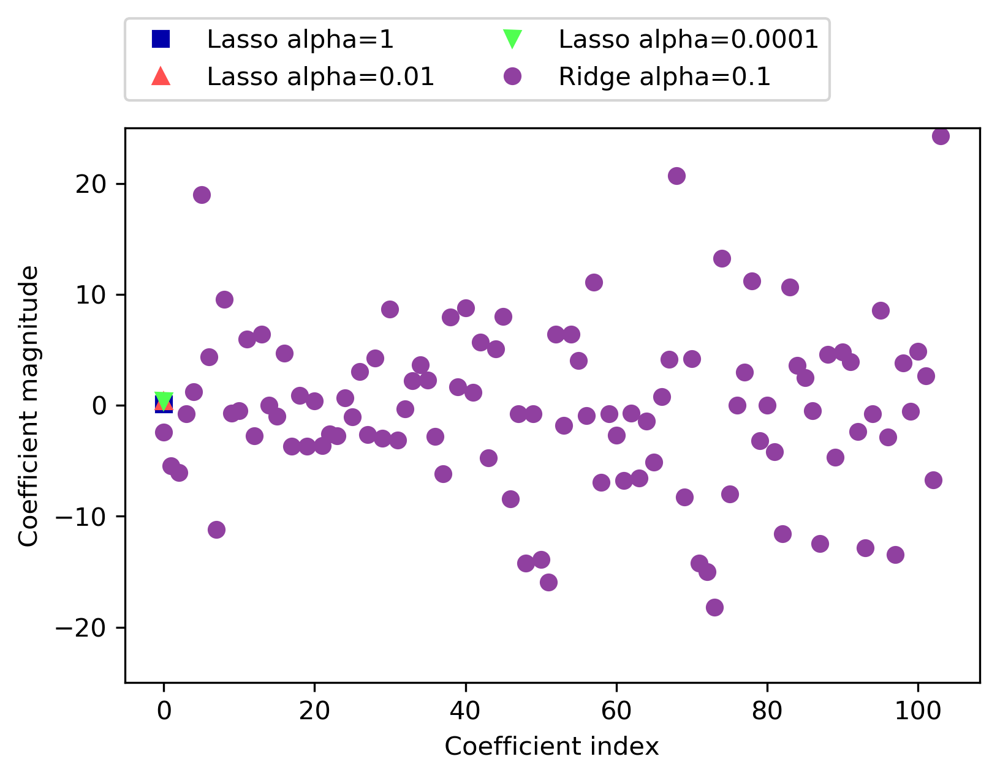

In [42]:
plt.plot(lasso.coef_, 's', label="Lasso alpha=1")
plt.plot(lasso001.coef_, '^', label="Lasso alpha=0.01")
plt.plot(lasso00001.coef_, 'v', label="Lasso alpha=0.0001")

plt.plot(ridge01.coef_, 'o', label="Ridge alpha=0.1")

plt.legend(ncol=2, loc=(0, 1.05))
plt.ylim(-25, 25)
plt.xlabel("Coefficient index")
plt.ylabel("Coefficient magnitude")

- Lasso 모델인 경우 많은 계수가 0이 되는 것을 알 수 있음
- 반면, Ridge 모델인 경우 계수가 0이 되는 경우는 극히 드물다.

#### Linear models for Classification (분류를 위한 선형 모델)

- LogisticRegression & LinearSVC
  - 기본적으로 L2 규제 사용
  - 대표적인 선형 분류 모델
- with forge data

In [43]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC

X, y = mglearn.datasets.make_forge()
print("Data shape: {}".format(X.shape))
print("Target shape: {}".format(y.shape))

Data shape: (26, 2)
Target shape: (26,)


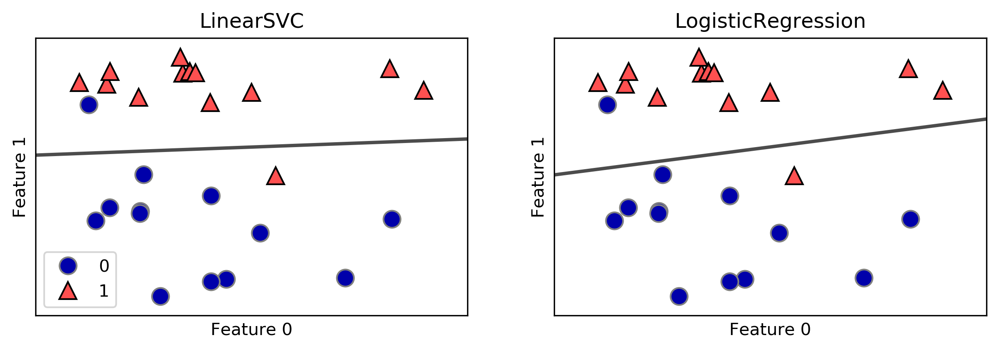

In [44]:
fig, axes = plt.subplots(1, 2, figsize=(10, 3))

for model, ax in zip([LinearSVC(), LogisticRegression()], axes):
    clf = model.fit(X, y)
    mglearn.plots.plot_2d_separator(clf, X, fill=False, eps=0.5, ax=ax, alpha=.7)
    mglearn.discrete_scatter(X[:, 0], X[:, 1], y, ax=ax)
    ax.set_title("{}".format(clf.__class__.__name__))
    ax.set_xlabel("Feature 0")
    ax.set_ylabel("Feature 1")
axes[0].legend()

- LogisticRegression & LinearSVC
  - C: 규제의 강도를 결정하는 매개변수
    - default: 1.0
    - Inverse of regularization strength; must be a positive float.
    - 높은 C 값: 규제의 감소 --> 훈련 세트에 최대로 맞춤
    - 낮은 C 값: 규제의 증대 --> 각각의 계수들을 최대로 0에 가깝게 만듦

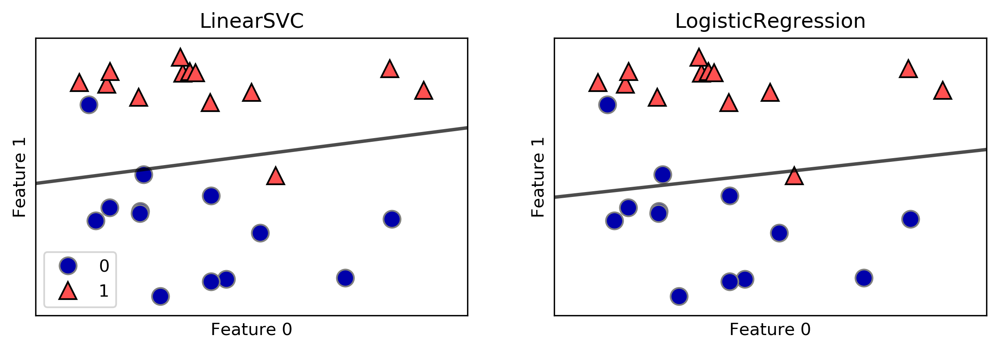

In [45]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC

X, y = mglearn.datasets.make_forge()

fig, axes = plt.subplots(1, 2, figsize=(10, 3))

for model, ax in zip([LinearSVC(C=0.01), LogisticRegression(C=0.01)], axes):
    clf = model.fit(X, y)
    mglearn.plots.plot_2d_separator(clf, X, fill=False, eps=0.5,
                                    ax=ax, alpha=.7)
    mglearn.discrete_scatter(X[:, 0], X[:, 1], y, ax=ax)
    ax.set_title("{}".format(clf.__class__.__name__))
    ax.set_xlabel("Feature 0")
    ax.set_ylabel("Feature 1")
axes[0].legend()

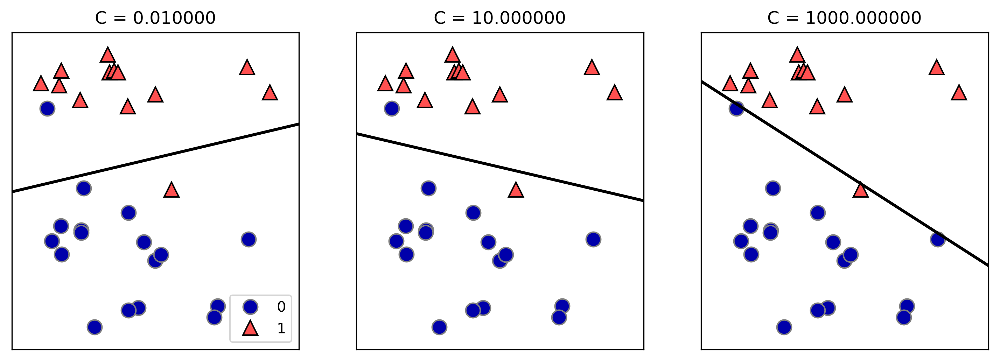

In [46]:
mglearn.plots.plot_linear_svc_regularization()

- with breast cancer data
  - 차원이 높은 데이터에 대해서는 선형 모델을 사용할 때 Overfitting 주의

In [47]:
from sklearn.datasets import load_breast_cancer
cancer = load_breast_cancer()
print("Shape of cancer data: {}".format(cancer.data.shape))

print()

X_train, X_test, y_train, y_test = train_test_split(cancer.data, cancer.target, stratify=cancer.target, random_state=42)
print("Shape of X_train: {}".format(X_train.shape))
print("Shape of X_test: {}".format(X_test.shape))

print()

logreg = LogisticRegression().fit(X_train, y_train)
print("Training set score: {:.3f}".format(logreg.score(X_train, y_train)))
print("Test set score: {:.3f}".format(logreg.score(X_test, y_test)))

Shape of cancer data: (569, 30)

Shape of X_train: (426, 30)
Shape of X_test: (143, 30)

Training set score: 0.955
Test set score: 0.958


In [48]:
logreg100 = LogisticRegression(C=100).fit(X_train, y_train)
print("Training set score: {:.3f}".format(logreg100.score(X_train, y_train)))
print("Test set score: {:.3f}".format(logreg100.score(X_test, y_test)))

Training set score: 0.979
Test set score: 0.965


In [49]:
logreg001 = LogisticRegression(C=0.01).fit(X_train, y_train)
print("Training set score: {:.3f}".format(logreg001.score(X_train, y_train)))
print("Test set score: {:.3f}".format(logreg001.score(X_test, y_test)))

Training set score: 0.934
Test set score: 0.930


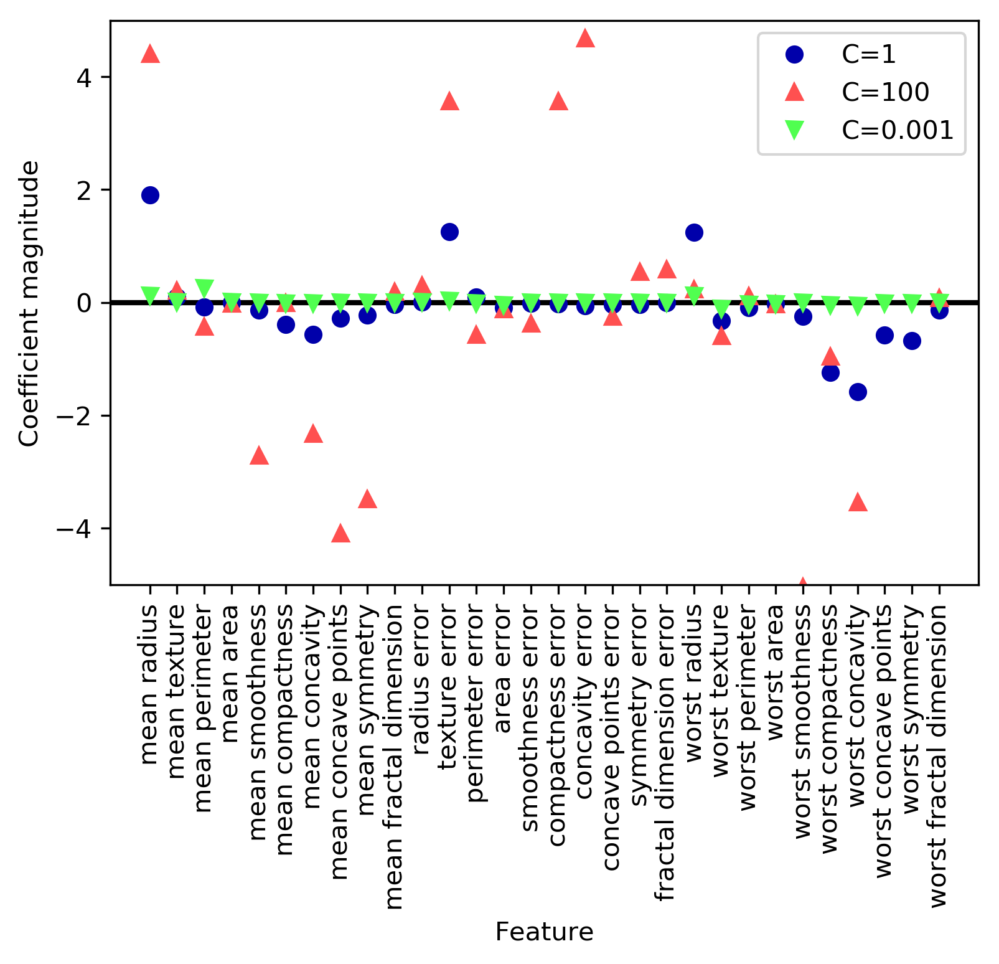

In [50]:
plt.plot(logreg.coef_.T, 'o', label="C=1")
plt.plot(logreg100.coef_.T, '^', label="C=100")
plt.plot(logreg001.coef_.T, 'v', label="C=0.001")
plt.xticks(range(cancer.data.shape[1]), cancer.feature_names, rotation=90)
xlims = plt.xlim()
plt.hlines(0, xlims[0], xlims[1])
plt.xlim(xlims)
plt.ylim(-5, 5)
plt.xlabel("Feature")
plt.ylabel("Coefficient magnitude")
plt.legend()

- L1 규제 사용
  - penalty = 'l1' 

Training accuracy of L1 logreg with C=0.001: 0.91
Test accuracy of l1 logreg with C=0.001: 0.92

Training accuracy of L1 logreg with C=1.000: 0.96
Test accuracy of l1 logreg with C=1.000: 0.96

Training accuracy of L1 logreg with C=100.000: 0.99
Test accuracy of l1 logreg with C=100.000: 0.98



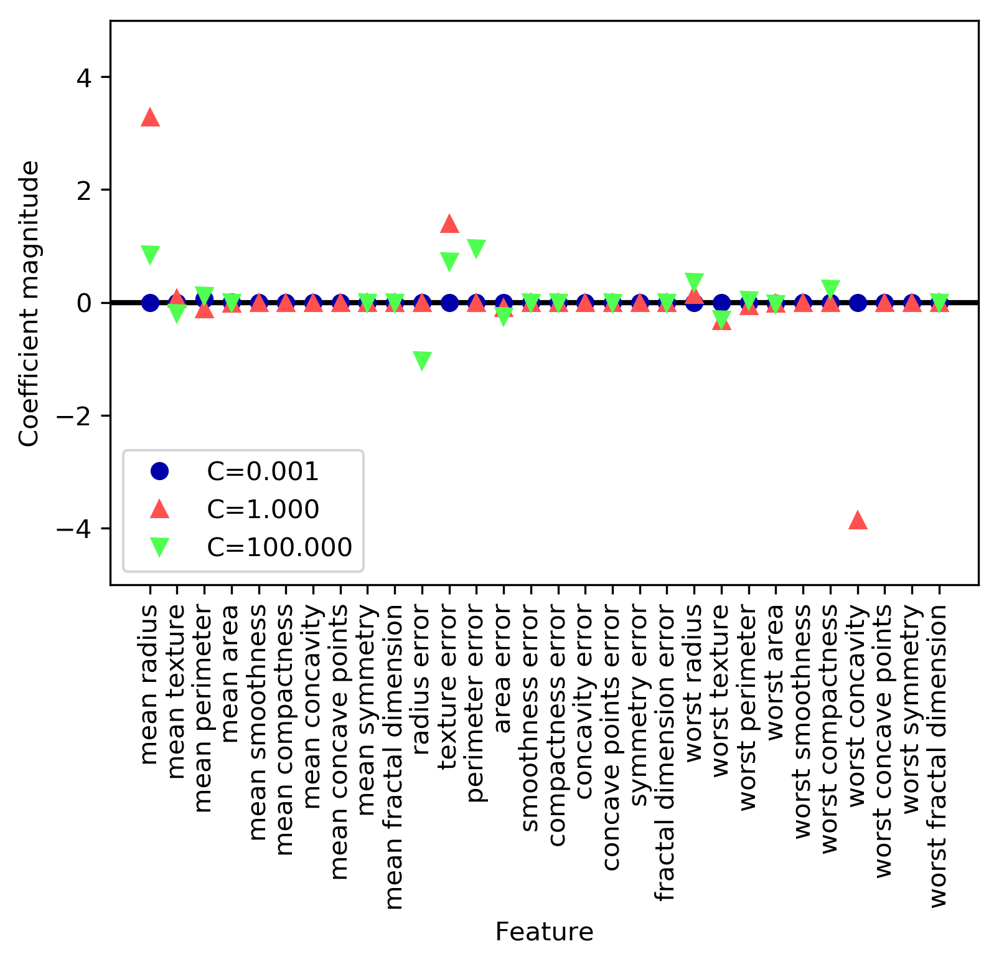

In [51]:
for C, marker in zip([0.001, 1, 100], ['o', '^', 'v']):
    lr_l1 = LogisticRegression(C=C, penalty="l1").fit(X_train, y_train)
    print("Training accuracy of L1 logreg with C={:.3f}: {:.2f}".format(C, lr_l1.score(X_train, y_train)))
    print("Test accuracy of l1 logreg with C={:.3f}: {:.2f}".format(C, lr_l1.score(X_test, y_test)))
    plt.plot(lr_l1.coef_.T, marker, label="C={:.3f}".format(C))
    print()

plt.xticks(range(cancer.data.shape[1]), cancer.feature_names, rotation=90)
xlims = plt.xlim()
plt.hlines(0, xlims[0], xlims[1])
plt.xlim(xlims)
plt.xlabel("Feature")
plt.ylabel("Coefficient magnitude")

plt.ylim(-5, 5)
plt.legend(loc=3)

##### Linear models for multiclass classification
- 일대다 (one-vs.-rest) 방법
  - 클래스의 개수 만큼 이진 분류기 생성
  - 예측을 할 때에는 만들어진 모든 이진 분류기를 사용하여 가장 높은 점수를 내는 분류기의 클래스를 예측값으로 선택

Data shape: (100, 2)
Target shape: (100,)
2
1
0


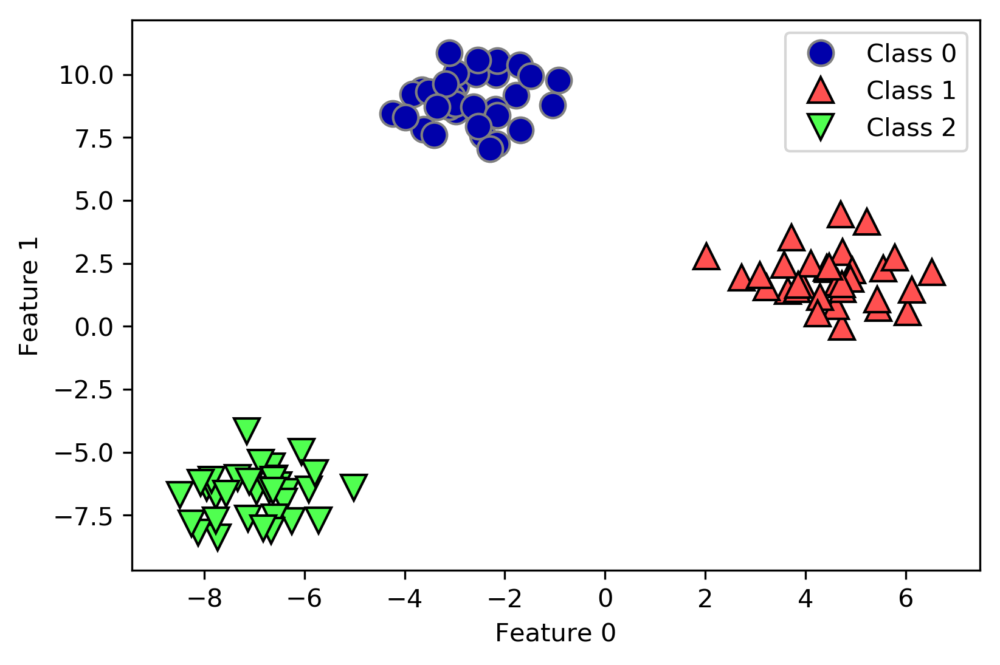

In [52]:
from sklearn.datasets import make_blobs

X, y = make_blobs(random_state=42)
print("Data shape: {}".format(X.shape))
print("Target shape: {}".format(y.shape))
print(y[0])
print(y[1])
print(y[2])

mglearn.discrete_scatter(X[:, 0], X[:, 1], y)
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")
plt.legend(["Class 0", "Class 1", "Class 2"])

In [53]:
linear_svm = LinearSVC().fit(X, y)
print("Coefficient shape: ", linear_svm.coef_.shape)
print("Intercept shape: ", linear_svm.intercept_.shape)

Coefficient shape:  (3, 2)
Intercept shape:  (3,)


- 각 세 개의 클래스 당 하나의 이진 분류기가 만들어짐
  - (3, 2) 에서 각 행은 각 클래스에 대응하는 계수 백터
  - (3,)은 각 클래스의 절편을 담은 1차원 벡터

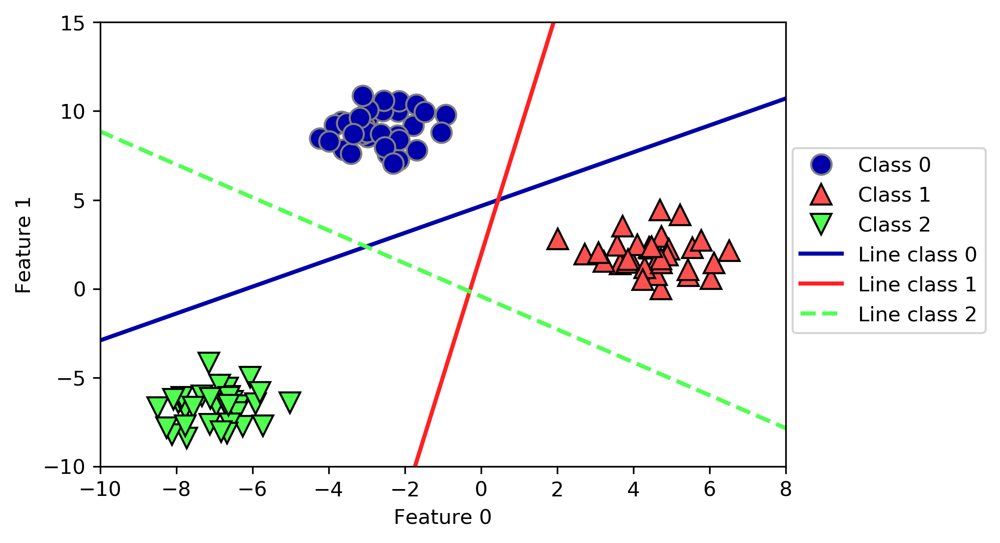

In [54]:
mglearn.discrete_scatter(X[:, 0], X[:, 1], y)
line = np.linspace(-15, 15)
for coef, intercept, color in zip(linear_svm.coef_, linear_svm.intercept_,
                                  mglearn.cm3.colors):
    plt.plot(line, -(line * coef[0] + intercept) / coef[1], c=color)
plt.ylim(-10, 15)
plt.xlim(-10, 8)
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")
plt.legend(['Class 0', 'Class 1', 'Class 2', 'Line class 0', 'Line class 1', 'Line class 2'], loc=(1.01, 0.3))

Text(0,0.5,'Feature 1')

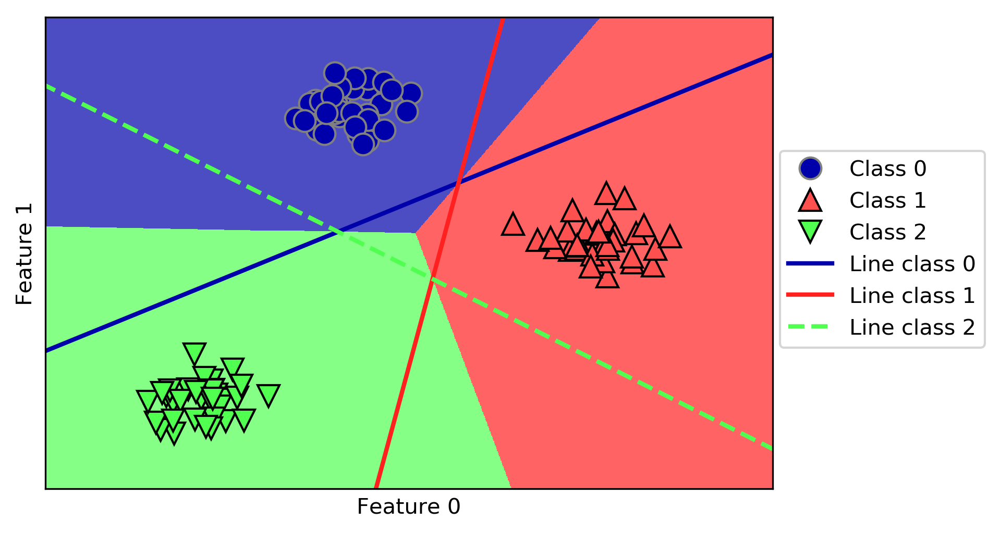

In [55]:
mglearn.plots.plot_2d_classification(linear_svm, X, fill=True, alpha=.7)
mglearn.discrete_scatter(X[:, 0], X[:, 1], y)
line = np.linspace(-15, 15)
for coef, intercept, color in zip(linear_svm.coef_, linear_svm.intercept_,
                                  mglearn.cm3.colors):
    plt.plot(line, -(line * coef[0] + intercept) / coef[1], c=color)
plt.legend(['Class 0', 'Class 1', 'Class 2', 'Line class 0', 'Line class 1',
            'Line class 2'], loc=(1.01, 0.3))
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")

#### Strengths, weaknesses and parameters
- Linear Regression
  - 특성 가중치 규제 강도 조정: alpha
    - alpha가 높으면 규제를 강화함 --> 모델이 단순해짐
- LinearSVC & LogisticRegression
  - 특성 가중치 규제 강도 조정: C
    - C가 낮으면 규제를 강화함 --> 모델이 단순해짐
- 보통 alpha와 C는 로그스케일로 값을 정함
  - 0.1, 1, 10 
- L1 vs. L2
  - 중요한 특성이 많지 않아서 몇몇 특성만 골라 활용하려고 하면 L1 규제 적당
  - 모델의 해석이 중요할 때에도 L1 규제 사용
- 대용량 데이터
  - LogisticRegression 과 Ridge 에 solver='sag' 옵션 설정
    - Stochastic Average Gradient Descent: 반복이 진행될 때 이전에 구한 모든 경사의 평균을 사용하여 계수를 갱신함
  - SGDClassifier, SGDRegressor 사용

##### Method Chaining (메소드 연결)

In [56]:
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [57]:
# instantiate model and fit it in one line
logreg = LogisticRegression().fit(X_train, y_train)

In [58]:
logreg = LogisticRegression()
y_pred = logreg.fit(X_train, y_train).predict(X_test)

In [59]:
y_pred = LogisticRegression().fit(X_train, y_train).predict(X_test)

### 2.3.4 Naive Bayes Classifiers
- LogisticRegression 이나 LinearSVC보다 훈련 속도가 빠르지만 일반화 성능이 조금 떨어짐
- scikit-learn 모델
  - GaussianNB
    - 연속 데이터에 적용
  - BernoulliNB
    - 이진 데이터에 적용
  - MultinomialNB
    - 카운트 데이터에 적용 
    - 예를 들면, 문장에 나타난 단어의 횟수
- 베이즈 정리
  - $\displaystyle P(A∣B)= \frac{P(B∩A)}{P(B)}=\frac{P(A)P(B∣A)}{P(B)}$
  ![!](https://upload.wikimedia.org/wikipedia/commons/thumb/1/18/Bayes%27_Theorem_MMB_01.jpg/440px-Bayes%27_Theorem_MMB_01.jpg)
  - [Source: wikipedia]
  <br/><br/>
- 베이즈 분류
  - 입력 데이터의 내용이 $X=(x_1, x_2, ..., x_p)$로 주어졌을 때 $Y=k$일 확률
    - $\displaystyle P(Y = k ~|~ X_1 = x_1, X_2=x_2, ... , X_p = x_p)=P(Y = k) P(X_1 = x_1, X_2=x_2, ... , X_p = x_p~|~Y = k)$<br/><br/>
  - 입력 데이터의 각 특성값의 조건부 분포가 서로 독립이라는 단순 베이즈 가정을 한다면
    - $\displaystyle P(Y = k ~|~ X_1 = x_1, X_2=x_2, ... , X_p = x_p)=P(Y = k) \prod_{j=1}^{p}P(X_j = x_j~|~Y = k)$<br/><br/>
  - 따라서, 입력 데이터의 내용이 $X=(x_1, x_2, ..., x_p)$로 주어졌을 때 $Y$ 예측 방법
    - $\displaystyle argmax_{k\in Y} \big{(}P(Y = k) \prod_{j=1}^{p}P(X_j = x_j~|~Y = k)\big{)}$

In [60]:
X = np.array([[0, 1, 0, 1],
              [1, 0, 1, 1],
              [0, 0, 0, 1],
              [1, 0, 1, 0]])
y = np.array([0, 1, 0, 1])

In [61]:
counts = {}
for label in np.unique(y):
    # iterate over each class
    # count (sum) entries of 1 per feature
    counts[label] = X[y == label].sum(axis=0)
print("Feature counts:\n{}".format(counts))

Feature counts:
{0: array([0, 1, 0, 2]), 1: array([2, 0, 2, 1])}


#### Strengths, weaknesses and parameters

### Decision trees

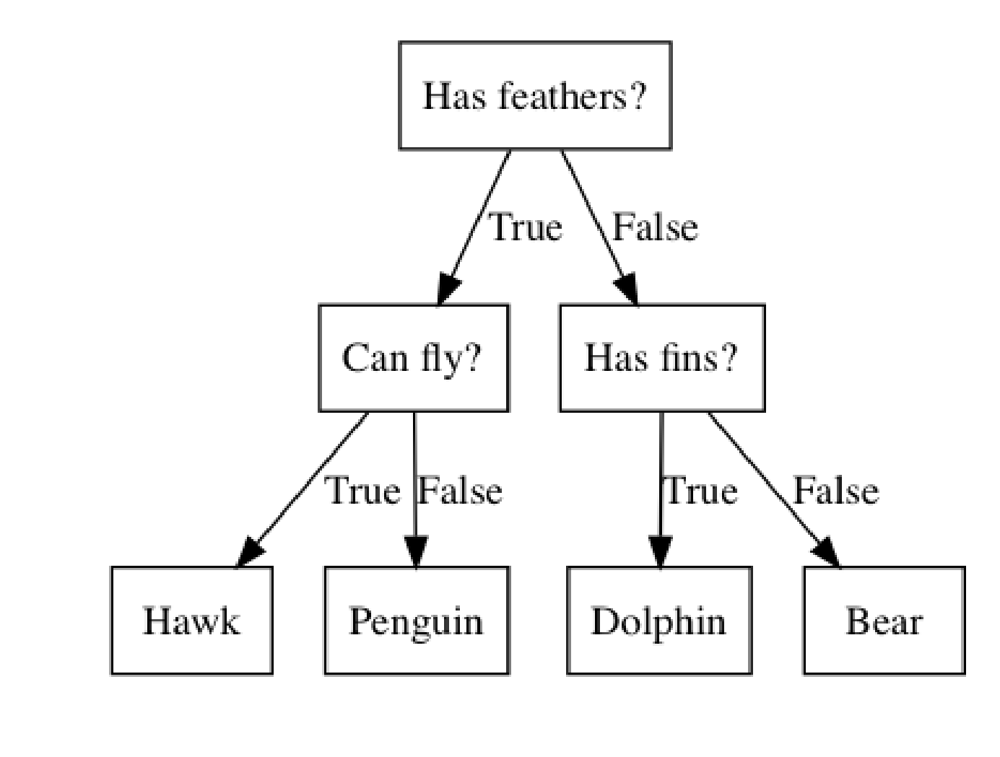

In [62]:
mglearn.plots.plot_animal_tree()

##### Building decision trees

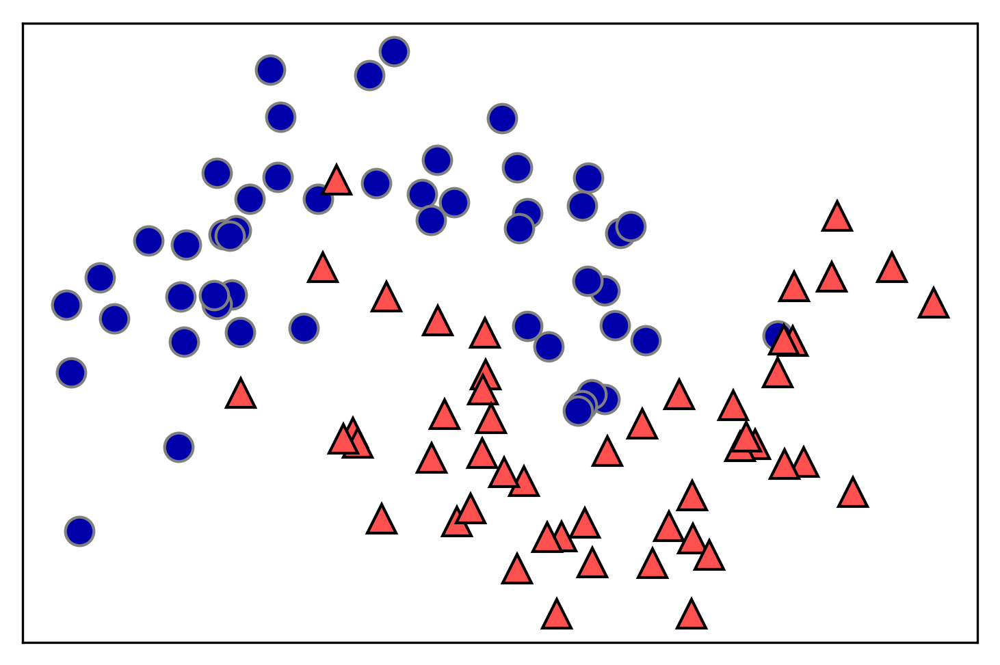

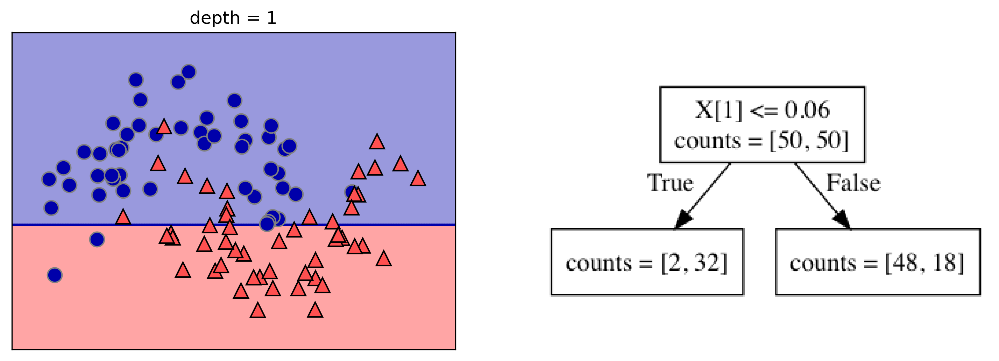

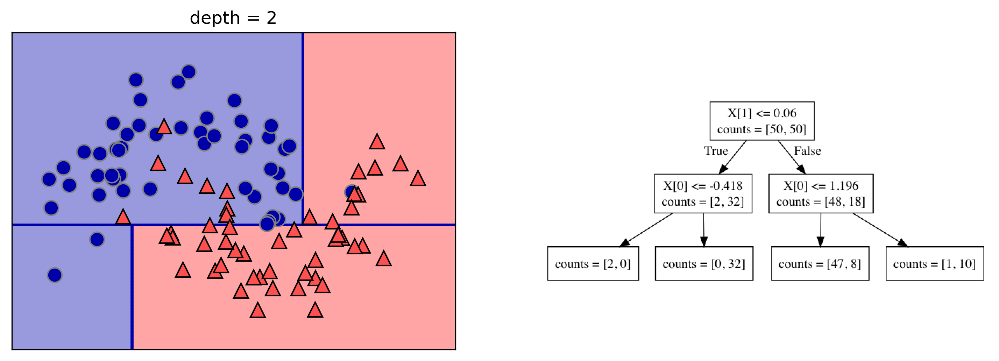

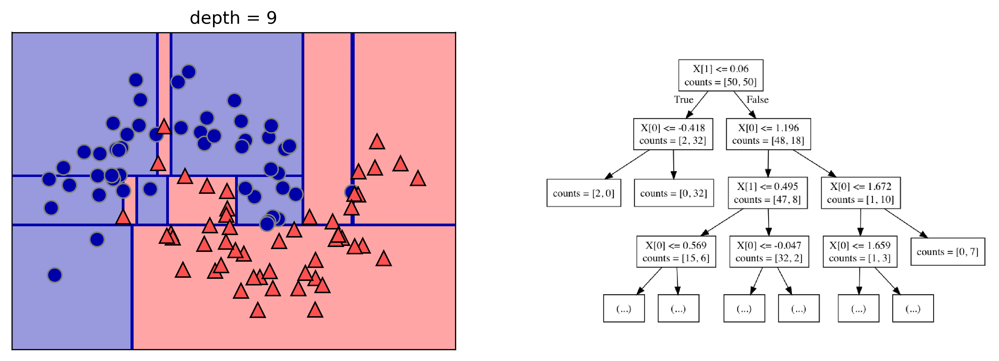

In [63]:
mglearn.plots.plot_tree_progressive()

##### Controlling complexity of decision trees

- Pre-pruning (사전 가지치기): 트리내 노드 생성을 사전에 중단
  - scikit-learn 에서 지원하는 것
  - 트리의 최대 깊이 제한
  - 트리 내 리프 노드 개수 제한
  - 분할 노드 개수 제한
- Post-pruning (사후 가지치기) or Pruning: 트리의 노드를 만든 이후 데이터 포인트가 적은 노드를 삭제하거나 병합

In [64]:
from sklearn.tree import DecisionTreeClassifier

cancer = load_breast_cancer()
print("Shape of cancer data: {}".format(cancer.data.shape))

Shape of cancer data: (569, 30)


In [65]:
X_train, X_test, y_train, y_test = train_test_split(cancer.data, cancer.target, stratify=cancer.target, random_state=42)
print("Shape of X_train: {}".format(X_train.shape))
print("Shape of X_test: {}".format(X_test.shape))

print()

tree = DecisionTreeClassifier(random_state=0)
tree.fit(X_train, y_train)
print("Accuracy on training set: {:.3f}".format(tree.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(tree.score(X_test, y_test)))

Shape of X_train: (426, 30)
Shape of X_test: (143, 30)

Accuracy on training set: 1.000
Accuracy on test set: 0.937


- 테스트 집합에 대한 0.937 정확도는 이전의 LogisticRegression의 테스트 집합 정확도보다 작음.

- 트리의 깊이 제한
  - max_depth=4

In [66]:
tree = DecisionTreeClassifier(max_depth=4, random_state=0)
tree.fit(X_train, y_train)

print("Accuracy on training set: {:.3f}".format(tree.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(tree.score(X_test, y_test)))

Accuracy on training set: 0.988
Accuracy on test set: 0.951


#### Analyzing Decision Trees

In [67]:
from sklearn.tree import export_graphviz
export_graphviz(tree, 
                out_file="tree.dot", 
                class_names=["malignant", "benign"],
                feature_names=cancer.feature_names, 
                impurity=True, # When set to True, show the impurity (gini) at each node.
                filled=True # 노드의 분류 클래스가 구분되도록 색이 칠해짐
)

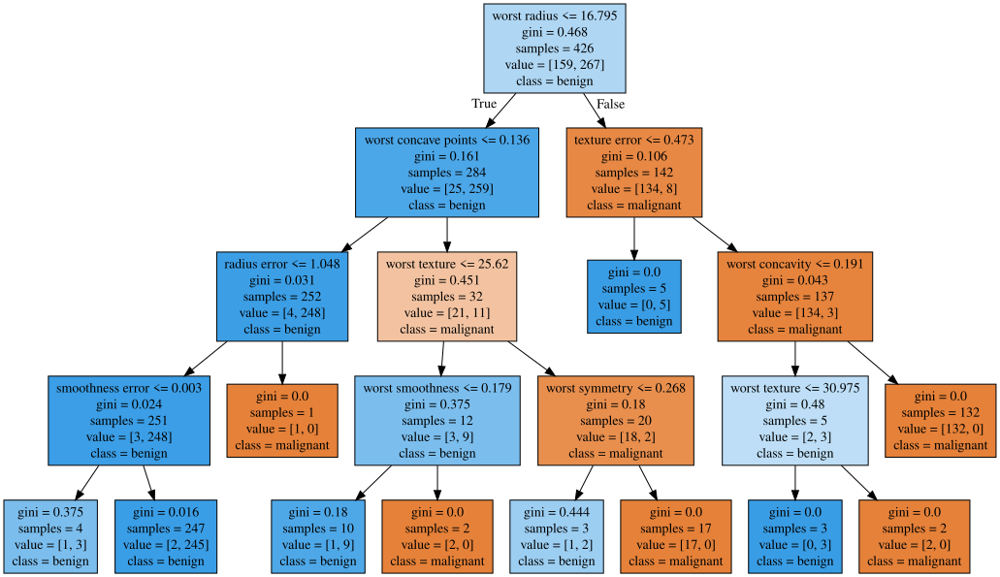

In [68]:
import graphviz

with open("tree.dot") as f:
    dot_graph = f.read()
display(graphviz.Source(dot_graph))

- 첫번째 루트 노드
  - 악성 샘플: 159, 양성 샘플: 267
- 루트 노드의 오른쪽 가지 노드
  - 악성 샘플: 134, 양성 샘플: 8
- 루트 노드의 왼쪽 가지 노드 
  - 악성 샘플: 25, 양성 샘플: 259

#### Feature Importance in trees
- 특성 중요도 (Feature Impotance)
  - 트리를 만드는 결정에 각 특성이 얼마나 중요한지를 평가
    - 0: 해당 특성이 분류에 전혀 활용되지 않았음
    - 1: 해당 특성이 분류를 하였고, 타깃 클래스를 정확하게 예측하였음을 나타냄

In [69]:
print("Feature importances:\n{}".format(tree.feature_importances_))

Feature importances:
[ 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.01
  0.048  0.     0.     0.002  0.     0.     0.     0.     0.     0.727
  0.046  0.     0.     0.014  0.     0.018  0.122  0.012  0.   ]


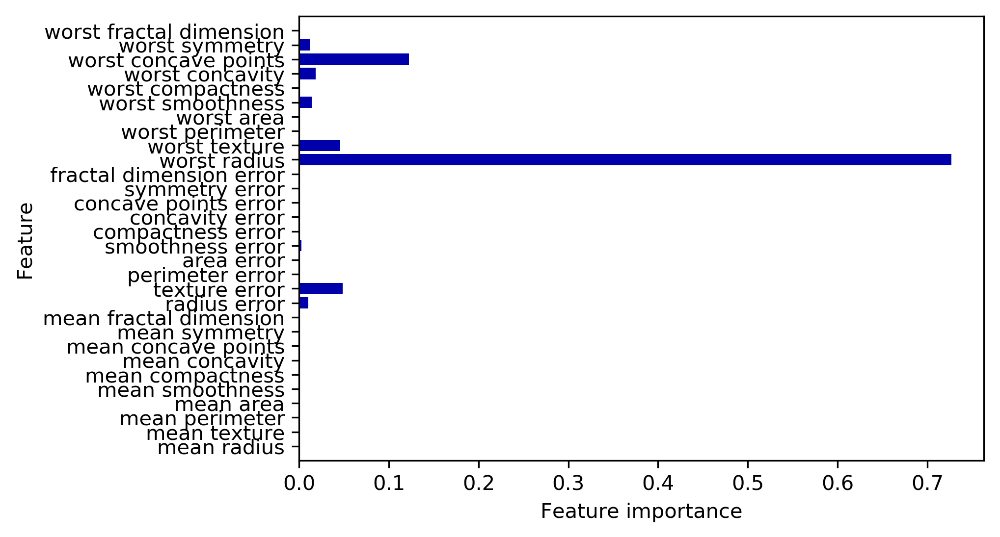

In [70]:
def plot_feature_importances_cancer(model):
    n_features = cancer.data.shape[1]
    plt.barh(range(n_features), model.feature_importances_, align='center')
    plt.yticks(np.arange(n_features), cancer.feature_names)
    plt.xlabel("Feature importance")
    plt.ylabel("Feature")
    plt.ylim(-1, n_features)
    plt.figure(figsize=(8, 6), dpi=80, facecolor='w', edgecolor='k')
    plt.show()

plot_feature_importances_cancer(tree)

- 특성 중요도는 항상 양수이며, 어떤 클래스를 지지하는 지 알 수는 없다.
  - 아래 예에서 X[1] 특성은 두 개 클래스를 동시에 지지함.

Feature importances: [ 0.  1.]


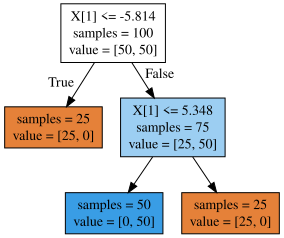

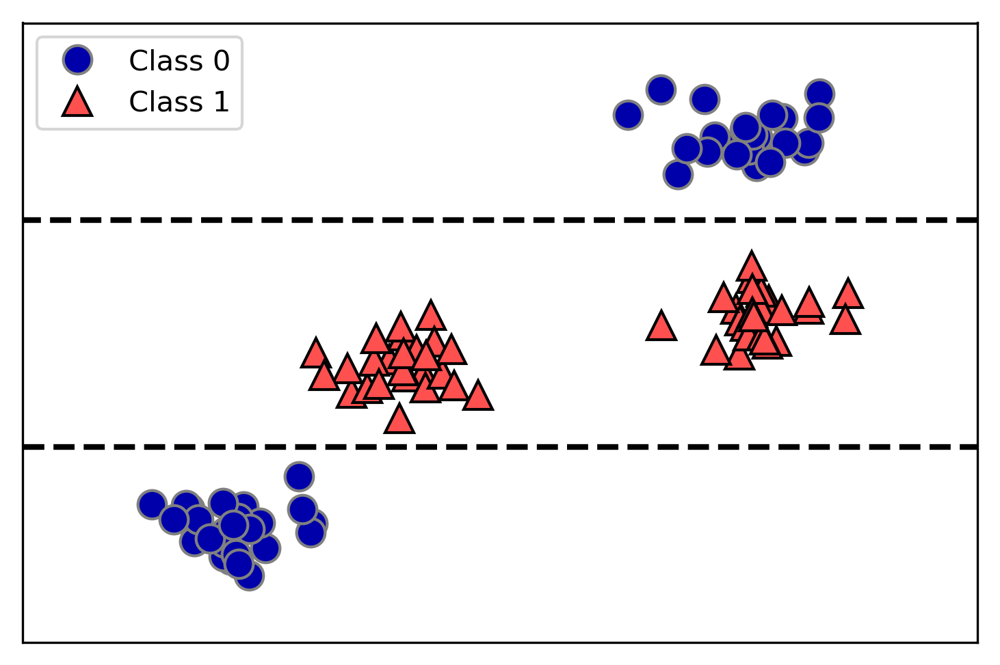

In [71]:
tree = mglearn.plots.plot_tree_not_monotone()
display(tree)

- Regression with DecisionTreeRegressor
- plt.semilogy()
  - Make a plot with log scaling on the `y` axis.

(333, 3)
   Unnamed: 0    date     price
0           0  1957.0  4.11e+08
1           1  1959.0  6.79e+07
2           2  1960.0  5.24e+06


Text(0,0.5,'Price in $/Mbyte')

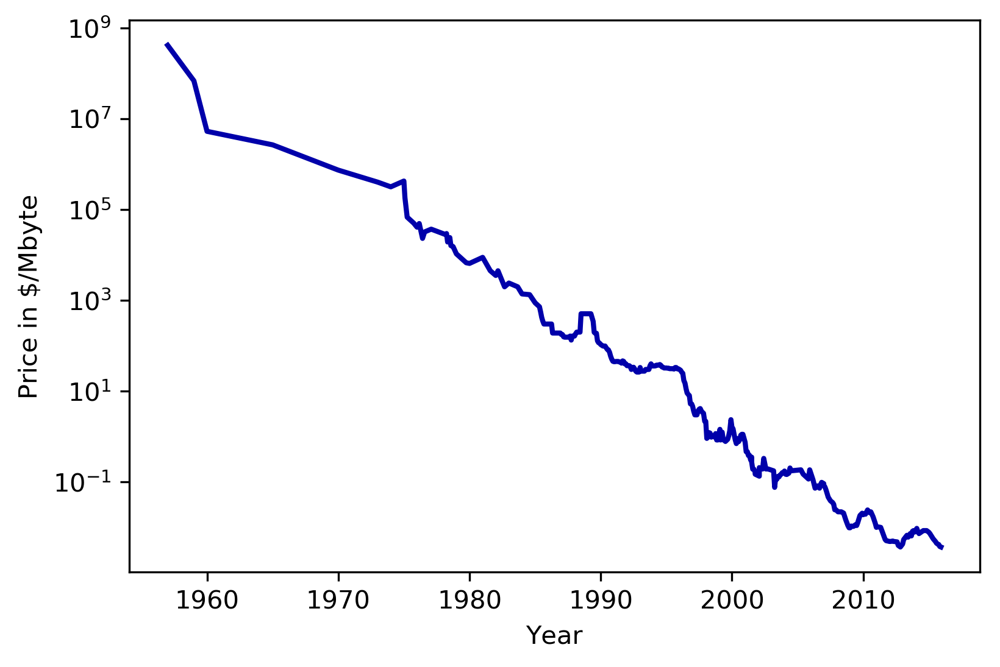

In [72]:
import os

ram_prices = pd.read_csv(os.path.join(mglearn.datasets.DATA_PATH, "ram_price.csv"))
print(ram_prices.shape)
print(ram_prices.head(3))

plt.semilogy(ram_prices.date, ram_prices.price)
plt.xlabel("Year")
plt.ylabel("Price in $/Mbyte")

In [73]:
from sklearn.tree import DecisionTreeRegressor
# use historical data to forecast prices after the year 2000
data_train = ram_prices[ram_prices.date < 2000]
data_test = ram_prices[ram_prices.date >= 2000]

print(data_train.shape)
print(data_train.head(3))

print()

print(data_test.shape)
print(data_test.head(3))

(202, 3)
   Unnamed: 0    date     price
0           0  1957.0  4.11e+08
1           1  1959.0  6.79e+07
2           2  1960.0  5.24e+06

(131, 3)
     Unnamed: 0     date  price
202         202  2000.00   1.56
203         203  2000.08   1.48
204         204  2000.17   1.08


In [74]:
# predict prices based on date
# np.newaxis 으로 새로운 demension 생성
temp_X_train = data_train.date
print(temp_X_train.shape)
print(temp_X_train[0])
print(temp_X_train[1])

print()

X_train = data_train.date[:, np.newaxis]
print(X_train.shape)
print(X_train[0])
print(X_train[1])

print()

# we use a log-transform to get a simpler relationship of data to target
y_train = np.log(data_train.price)
print(y_train.shape)
print(y_train[0])
print(y_train[1])

(202,)
1957.0
1959.0

(202, 1)
[ 1957.]
[ 1959.]

(202,)
19.834205451
18.0342492175


- 날짜 대비 메모리 가격의 관계를 선형으로 변경하여 예측 성능을 높힘.

In [75]:
X_test = data_test.date[:, np.newaxis]
y_test = np.log(data_test.price)

In [76]:
tree = DecisionTreeRegressor().fit(X_train, y_train)
linear_reg = LinearRegression().fit(X_train, y_train)

# predict on all data (훈련 데이터와 테스트 데이터를 포함한 모든 데이터에 대하여 예측 수행)
X_all = ram_prices.date[:, np.newaxis]

pred_tree = tree.predict(X_all)
pred_lr = linear_reg.predict(X_all)

# undo log-transform
price_tree = np.exp(pred_tree)
price_lr = np.exp(pred_lr)

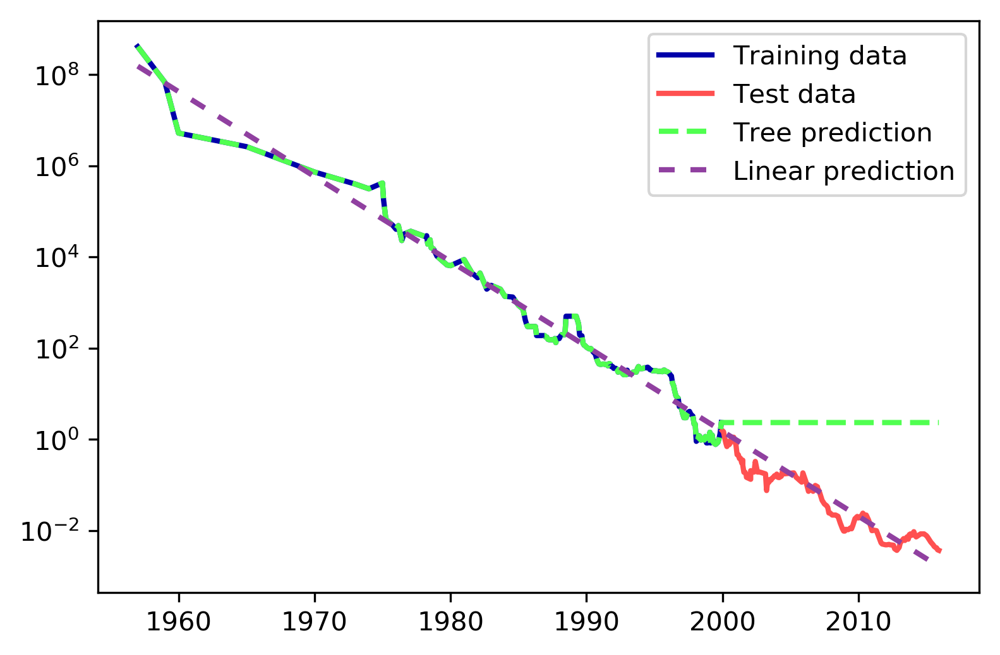

In [77]:
plt.semilogy(data_train.date, data_train.price, label="Training data")
plt.semilogy(data_test.date, data_test.price, label="Test data")
plt.semilogy(ram_prices.date, price_tree, label="Tree prediction")
plt.semilogy(ram_prices.date, price_lr, label="Linear prediction")
plt.legend()

- 위 트리 모델 훈련시에 모델 복잡도에 제한을 두지 않았음. 
  - 훈련 데이터를 완벽하게 예측함 --> 과적합
- 트리 모델을 사용한 테스트 시에 예측해야 할 값이 모델을 생성할 때 사용한 데이터 범위 밖에 존재할 때 트리는 적당하지 않음.

#### Strengths, weaknesses and parameters

- 트리 모델의 장점
  - 만들어진 모델을 쉽게 시각화하고 이해할 수 있음.
  - 각 특성은 개별적으로 다루어지기 때문에 특성의 정규화가 필요없음.
    - 각 특성의 스케일이 서로 달라도 문제 없이 모델 학습이 이루어짐.<br/><br/>

- 트리 모델의 단점
  - 사전 가지치기를 사용할 지라도 종종 과대적합되는 경향이 있음. --> 해결책: Ensemble

### 2.3.6 Ensembles of Decision Trees
##### Random forests
###### Building random forests
###### Analyzing random forests

In [78]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_moons

X, y = make_moons(n_samples=100, noise=0.25, random_state=3)

print("Data shape: {}".format(X.shape))
print("Target shape: {}".format(y.shape))

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=42)

Data shape: (100, 2)
Target shape: (100,)


In [79]:
forest = RandomForestClassifier(n_estimators=5, random_state=2)
forest.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=5, n_jobs=1,
            oob_score=False, random_state=2, verbose=0, warm_start=False)

- RandomForestClassifier
  - http://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html
  - 각 트리에 대해 독립적인 bootstrap sample 생성
    - bootstrap samples
      - n_samples 개의 데이터 포인트 중에서 무작위로 n_samples 개의 데이터를 추출 (하나의 샘플이 중복되어 추출 가능)
  - n_estimators
    - 생성할 트리의 개수    
  - max_features
    - 각 트리 노드에서 후보 특성을 무작위로 선정
    - 그러한 선정 작업시에 몇 개의 특성까지 선정할지를 결정함
    - 후보 특성을 선정하는 작업은 매 노드마다 반복 --> 각 노드는 서로 다른 후보 특성을 사용하게 됨
    - max_features를 n_features로 설정하면 각 노드에서 모든 특성을 고려 --> 무작위성이 줄어들게 됨
    - max_features를 1로 설정하면 각 노드에서 선택된 특성의 임계값만으로 분기 --> 트리의 깊이가 깊어짐
    - 기본값: auto
      - RandomForestClassifier: sqrt(n_features)
      - RandomForestRegressor: n_features
  - n_jobs
    - 사용할 CPU 코어 수 지정
    - n_jobs = -1 로 지정하면 컴퓨터의 모든 코어 사용
  - random_state
    - 서로 다른 random_state에 대해 전혀 다른 트리들이 생성
  - max_depth
    - 사전 가지치기 옵션
  - min_samples_split: int, float, optional (default=2)
    - The minimum number of samples required to split an internal node:
    - If int, then consider min_samples_split as the minimum number.
    - If float, then min_samples_split is a percentage and ceil(min_samples_split * n_samples) are the minimum number of samples for each split.

In [80]:
mat = np.ones((2,3))
print(mat.shape)
print(mat)

print()

mat2 = mat.ravel()  # ravel: 얽힌 것을 풀다.
print(mat2.shape)
print(mat2)

(2, 3)
[[ 1.  1.  1.]
 [ 1.  1.  1.]]

(6,)
[ 1.  1.  1.  1.  1.  1.]


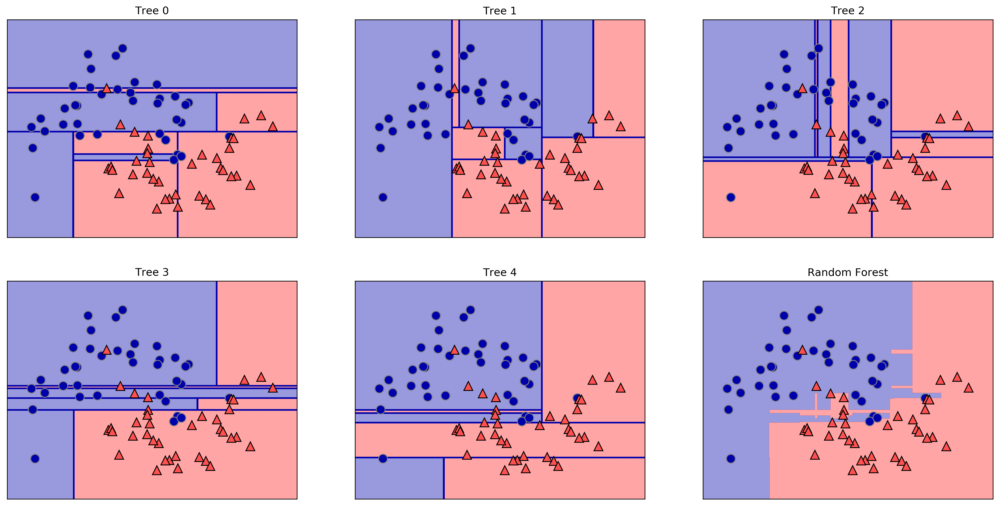

In [81]:
fig, axes = plt.subplots(2, 3, figsize=(20, 10))

for i, (ax, tree) in enumerate(zip(axes.ravel(), forest.estimators_)):
    ax.set_title("Tree {}".format(i))
    mglearn.plots.plot_tree_partition(X_train, y_train, tree, ax=ax)
    
mglearn.plots.plot_2d_separator(forest, X_train, fill=True, ax=axes[-1, -1], alpha=.4)
axes[-1, -1].set_title("Random Forest")
mglearn.discrete_scatter(X_train[:, 0], X_train[:, 1], y_train)

In [82]:
X_train, X_test, y_train, y_test = train_test_split(cancer.data, cancer.target, random_state=0)

forest = RandomForestClassifier(n_estimators=100, random_state=0)
forest.fit(X_train, y_train)

print("Accuracy on training set: {:.3f}".format(forest.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(forest.score(X_test, y_test)))

Accuracy on training set: 1.000
Accuracy on test set: 0.972


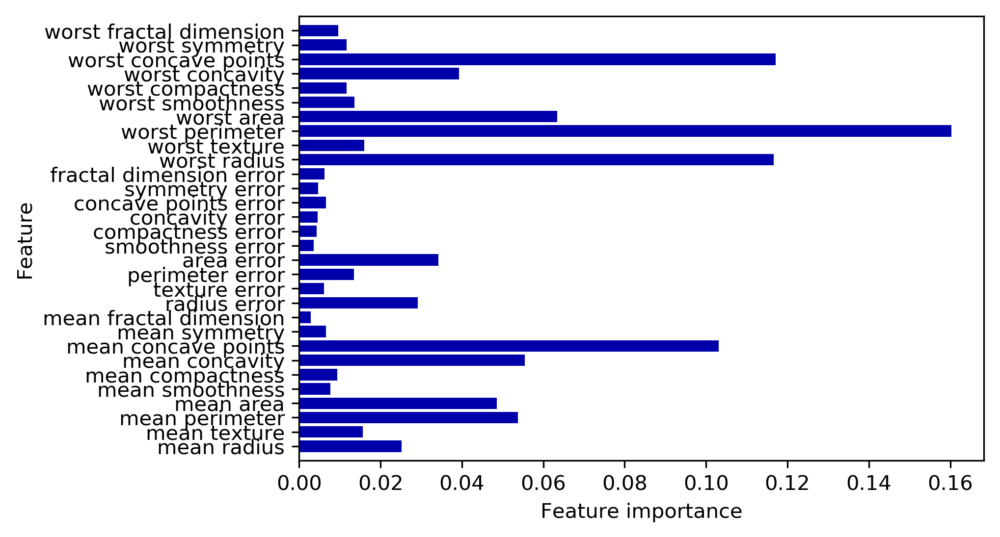

In [83]:
plot_feature_importances_cancer(forest)

- 랜덤 포레스트를 만드는 무작위성
  - 알고리즘이 가능성 있는 많은 경우를 고려할 수 있게 해줌
  - 단일 트리 방식보다 더 넓은 시각으로 데이터를 바라볼 수 있게 해줌

###### Strengths, weaknesses, and parameters
- 랜던 포레스트는 회귀와 분류에 있어서 가장 널리 사용되는 머신러닝 알고리즘
- 대부분의 경우에 있어서 성능이 뛰어나고 매개변수 튜닝없이도 잘 작동
- 데이터 feature개수가 많지만 (차원이 높고) 희소한 데이터에서는 성능이 낮음
- 선형 모델보다 속도가 느리고 더 많은 메모리 사용
- 가용한 시간과 메모리가 허용하는 한 n_estimators는 클수록 좋음 --> 더 많은 트리 사용

#### Gradient Boosted Regression Trees (Gradient Boosting Machines)
- 회귀와 분류 모두에 사용
  - GradientBoostingClassifier
  - GradientBoostingRegressor
- 이전 트리의 예측과 타깃값 사이의 오차를 줄이는 방향으로 트리를 구성
  - 경사 하강법을 사용하여 다음에 추가될 트리가 예측해야 할 값을 보정
- 기본적으로 무작위성이 없으며, 강력한 사전 가지치기 사용
  - 1~5 레벨 정도의 깊지 않은 트리 구성
  - 메모리를 적게 사용하고 예측도 빠름
- 많은 개수의 Weak Learner (얕은 트리의 간단한 모델)를 활용
- 주요 파라미터: learning_rate, n_estimators
  - learning_rate가 크면 이전 트리의 보정을 강하게 하기 때문에 더 복잡한 모델을 구성하게 됨.
  - n_estimators 값을 키워서 앙상블 내에 트리의 개수를 증가시키는 것이 좋음.

In [84]:
from sklearn.ensemble import GradientBoostingClassifier

X_train, X_test, y_train, y_test = train_test_split(cancer.data, cancer.target, random_state=0)

gbrt = GradientBoostingClassifier(random_state=0)
gbrt.fit(X_train, y_train)

print("Accuracy on training set: {:.3f}".format(gbrt.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(gbrt.score(X_test, y_test)))

Accuracy on training set: 1.000
Accuracy on test set: 0.958


- GradientBoostingClassifier 파라미터 기본값
  - max_depth=3 (트리 깊이 3)
  - n_estimators = 100 (트리 100개)
  - learning_rate = 0.1

In [85]:
gbrt = GradientBoostingClassifier(random_state=0, max_depth=1)
gbrt.fit(X_train, y_train)

print("Accuracy on training set: {:.3f}".format(gbrt.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(gbrt.score(X_test, y_test)))

Accuracy on training set: 0.991
Accuracy on test set: 0.972


In [86]:
gbrt = GradientBoostingClassifier(random_state=0, learning_rate=0.01)
gbrt.fit(X_train, y_train)

print("Accuracy on training set: {:.3f}".format(gbrt.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(gbrt.score(X_test, y_test)))

Accuracy on training set: 0.988
Accuracy on test set: 0.965


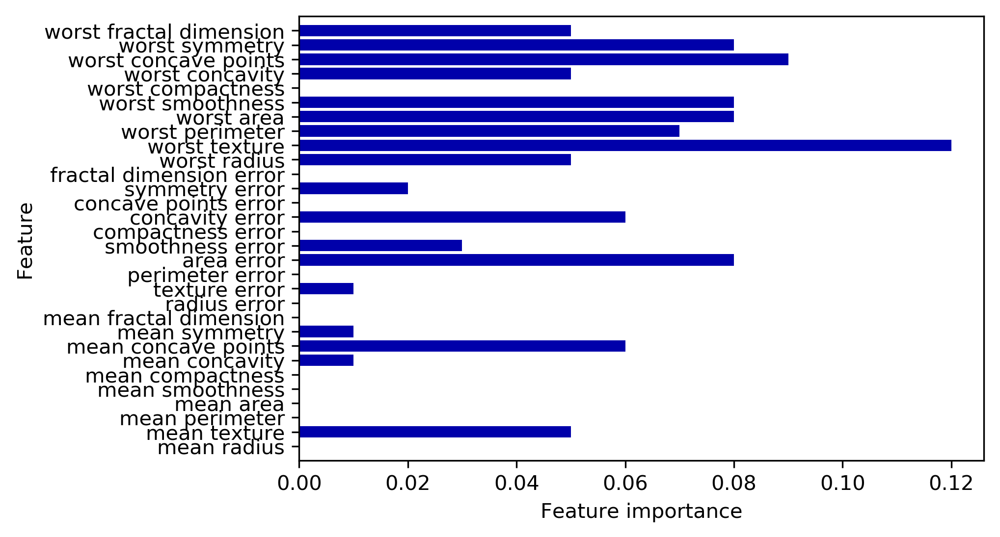

In [87]:
gbrt = GradientBoostingClassifier(random_state=0, max_depth=1)
gbrt.fit(X_train, y_train)

plot_feature_importances_cancer(gbrt)

- GradientBoostingClassifier에서는 일부 특성이 종종 완전히 무시됨

##### Strengths, weaknesses and parameters
- GradientBoostingClassifier 방법
  - 지도학습에서 가장 강력하고 널리 사용되는 모델 중 하나
  - 단점
    - 매개변수 조정 필요
    - 훈련시간이 다소 길다.
    - 특성들에 대해 희소한 고차원 데이터에서 잘 작동하지 않음
<!-- more -->
<br/><br/>
- xgboost (https://xgboost.readthedocs.io) 사용 검토 필요
  - 대용량 분산 처리 지원
  - GPU 활용 플러그인 지원

### 2.3.7 Kernelized Support Vector Machines
#### Linear Models and Non-linear Features

Text(0,0.5,'Feature 1')

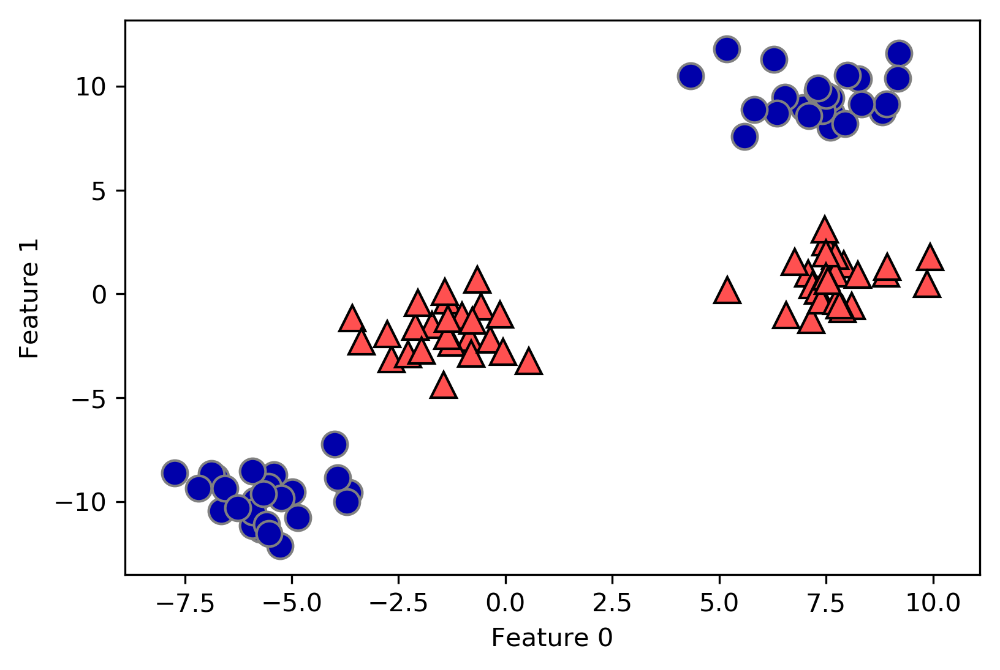

In [88]:
X, y = make_blobs(centers=4, random_state=8)
y = y % 2

mglearn.discrete_scatter(X[:, 0], X[:, 1], y)
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")

Text(0,0.5,'Feature 1')

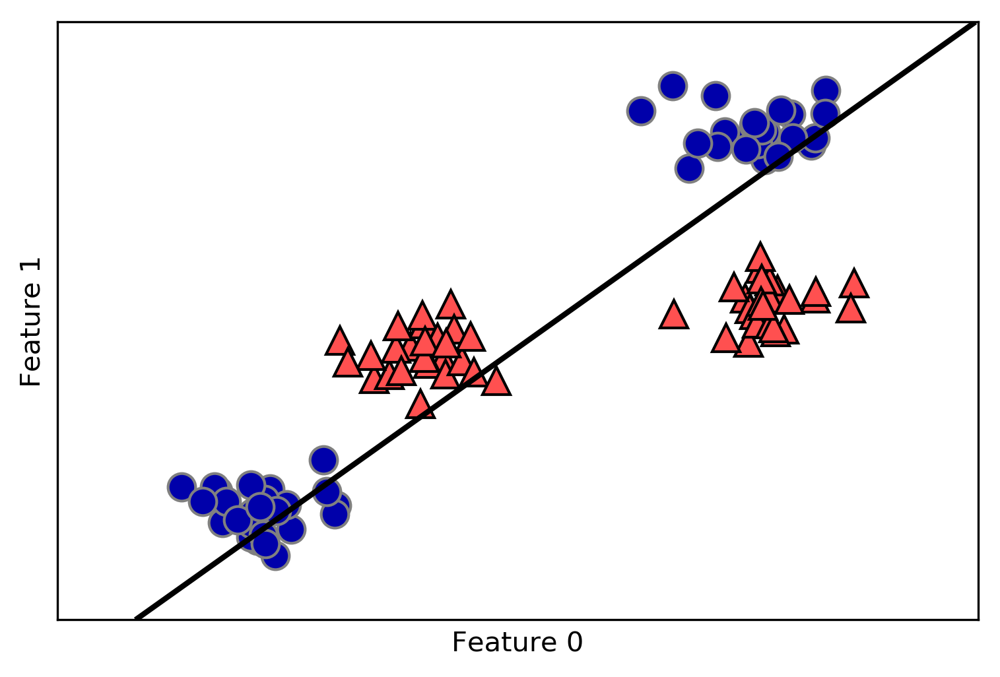

In [89]:
from sklearn.svm import LinearSVC
linear_svm = LinearSVC().fit(X, y)

mglearn.plots.plot_2d_separator(linear_svm, X)
mglearn.discrete_scatter(X[:, 0], X[:, 1], y)
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")

- 원본 데이터셋에 비선형 특성을 추가하여 선형모델(LinearSVC)을 그대로 사용하는 방법

In [90]:
# add the squared first feature
X_new = np.hstack([X, X[:, 1:] ** 2])
print("X - Data shape: {}".format(X.shape))
print(X[0])
print(X[1])
print(X[2])
print()

print("X_new - Data shape: {}".format(X_new.shape))
print(X_new[0])
print(X_new[1])
print(X_new[2])

X - Data shape: (100, 2)
[-1.722 -1.48 ]
[-3.657 -9.548]
[ 7.078  0.995]

X_new - Data shape: (100, 3)
[-1.722 -1.48   2.191]
[ -3.657  -9.548  91.169]
[ 7.078  0.995  0.99 ]


Text(0.5,0,'feature1 ** 2')

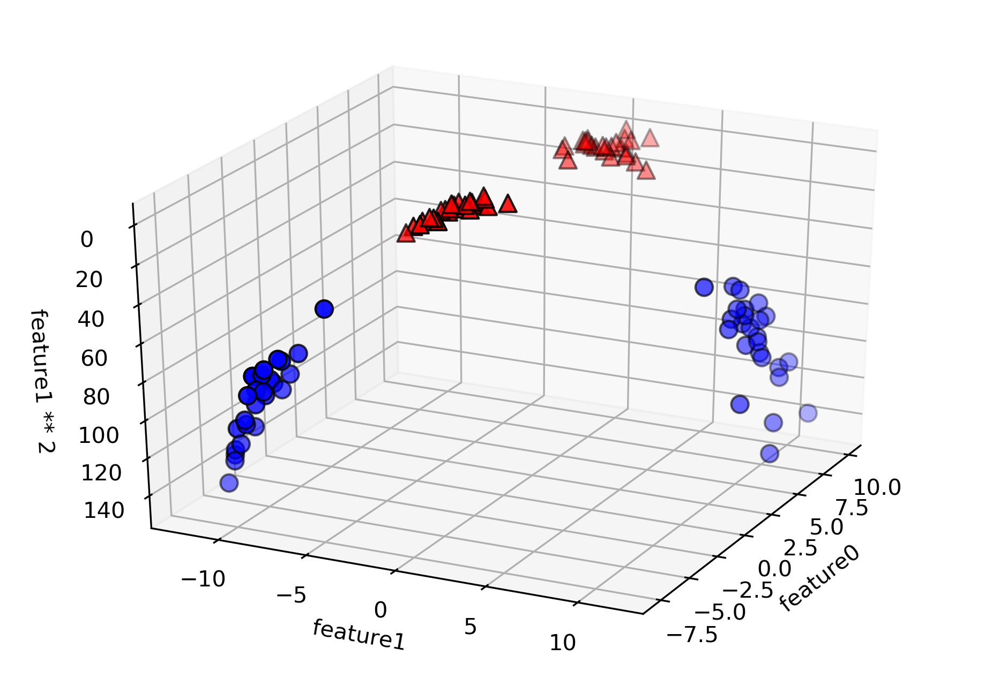

In [91]:
from mpl_toolkits.mplot3d import Axes3D, axes3d
figure = plt.figure()
# visualize in 3D
ax = Axes3D(figure, elev=-152, azim=-26)
# plot first all the points with y==0, then all with y == 1
mask = y == 0
ax.scatter(X_new[mask, 0], X_new[mask, 1], X_new[mask, 2], c='b', cmap=mglearn.cm2, s=60, edgecolor='k')
ax.scatter(X_new[~mask, 0], X_new[~mask, 1], X_new[~mask, 2], c='r', marker='^', cmap=mglearn.cm2, s=60, edgecolor='k')
ax.set_xlabel("feature0")
ax.set_ylabel("feature1")
ax.set_zlabel("feature1 ** 2")

In [92]:
linear_svm_3d = LinearSVC().fit(X_new, y)
coef, intercept = linear_svm_3d.coef_.ravel(), linear_svm_3d.intercept_
print("coef shape:", coef.shape)
print(coef)
print("intercept shape:", intercept.shape)
print(intercept)

coef shape: (3,)
[ 0.116 -0.194 -0.057]
intercept shape: (1,)
[ 1.154]


In [93]:
# show linear decision boundary
xx = np.linspace(X_new[:, 0].min() - 2, X_new[:, 0].max() + 2, 50)
yy = np.linspace(X_new[:, 1].min() - 2, X_new[:, 1].max() + 2, 50)
print("xx shape:", xx.shape)
print("yy shape:", xx.shape)
print(xx[0], xx[1], "...", xx[-1])
print(yy[0], yy[1], "...", yy[-1])

print()

XX, YY = np.meshgrid(xx, yy)
ZZ = (coef[0] * XX + coef[1] * YY + intercept) / -coef[2]
print("XX shape:", XX.shape)
print("YY shape:", YY.shape)
print("ZZ shape:", ZZ.shape)
print(XX[0])
print(XX[1])
print(XX[-1])

print(YY[0])
print(YY[1])
print(YY[-1])

xx shape: (50,)
yy shape: (50,)
-9.7406465808 -9.29840934402 ... 11.9289780217
-14.1188069772 -13.549430354 ... 13.7806475598

XX shape: (50, 50)
YY shape: (50, 50)
ZZ shape: (50, 50)
[ -9.741  -9.298  -8.856  -8.414  -7.972  -7.529  -7.087  -6.645  -6.203
  -5.761  -5.318  -4.876  -4.434  -3.992  -3.549  -3.107  -2.665  -2.223
  -1.78   -1.338  -0.896  -0.454  -0.011   0.431   0.873   1.315   1.758
   2.2     2.642   3.084   3.526   3.969   4.411   4.853   5.295   5.738
   6.18    6.622   7.064   7.507   7.949   8.391   8.833   9.276   9.718
  10.16   10.602  11.045  11.487  11.929]
[ -9.741  -9.298  -8.856  -8.414  -7.972  -7.529  -7.087  -6.645  -6.203
  -5.761  -5.318  -4.876  -4.434  -3.992  -3.549  -3.107  -2.665  -2.223
  -1.78   -1.338  -0.896  -0.454  -0.011   0.431   0.873   1.315   1.758
   2.2     2.642   3.084   3.526   3.969   4.411   4.853   5.295   5.738
   6.18    6.622   7.064   7.507   7.949   8.391   8.833   9.276   9.718
  10.16   10.602  11.045  11.487  11.929]
[ 

Text(0.5,0,'feature1 ** 2')

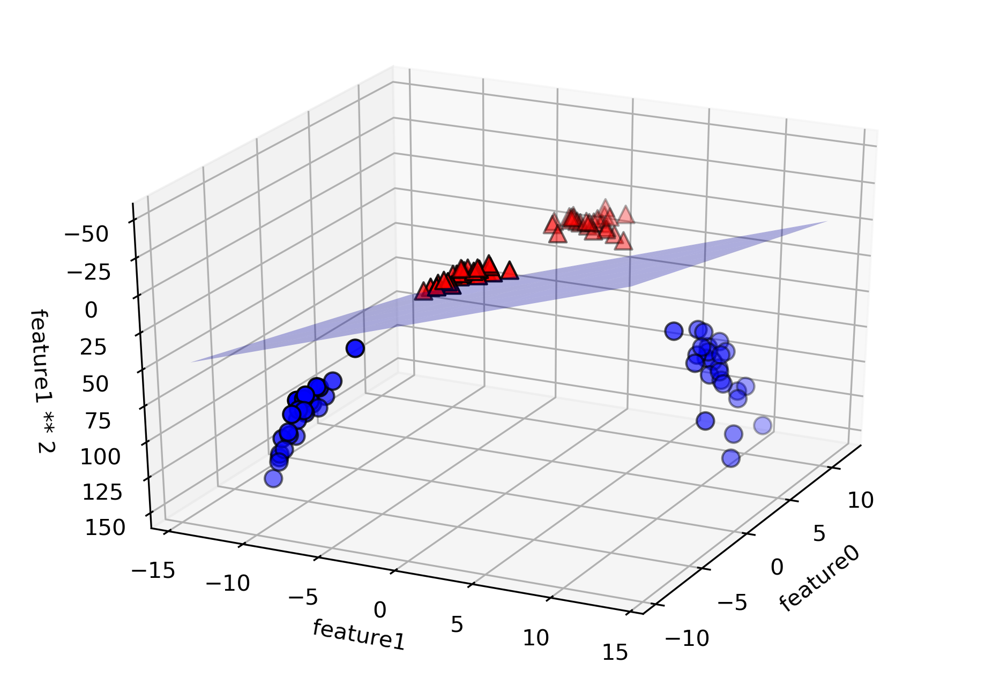

In [94]:
figure = plt.figure()
ax = Axes3D(figure, elev=-152, azim=-26)

ax.plot_surface(XX, YY, ZZ, rstride=8, cstride=8, alpha=0.3)
ax.scatter(X_new[mask, 0], X_new[mask, 1], X_new[mask, 2], c='b', cmap=mglearn.cm2, s=60, edgecolor='k')
ax.scatter(X_new[~mask, 0], X_new[~mask, 1], X_new[~mask, 2], c='r', marker='^', cmap=mglearn.cm2, s=60, edgecolor='k')

ax.set_xlabel("feature0")
ax.set_ylabel("feature1")
ax.set_zlabel("feature1 ** 2")

In [95]:
# https://docs.scipy.org/doc/numpy-1.13.0/reference/generated/numpy.c_.html
type(np.c_)

numpy.lib.index_tricks.CClass

In [96]:
print(XX.ravel()[0], XX.ravel()[1], "...", XX.ravel()[-1])
print(YY.ravel()[0], YY.ravel()[1], "...", YY.ravel()[-1])
print(ZZ.ravel()[0], ZZ.ravel()[1], "...", ZZ.ravel()[-1])

print()

c = np.c_[XX.ravel(), YY.ravel(), ZZ.ravel()]
print(c.shape)
print(c[0])
print(c[1])
print(c[-1])

-9.7406465808 -9.29840934402 ... 11.9289780217
-14.1188069772 -14.1188069772 ... 13.7806475598
48.5645394478 49.4657093617 ... -2.40585509081

(2500, 3)
[ -9.741 -14.119  48.565]
[ -9.298 -14.119  49.466]
[ 11.929  13.781  -2.406]


Text(0,0.5,'Feature 1')

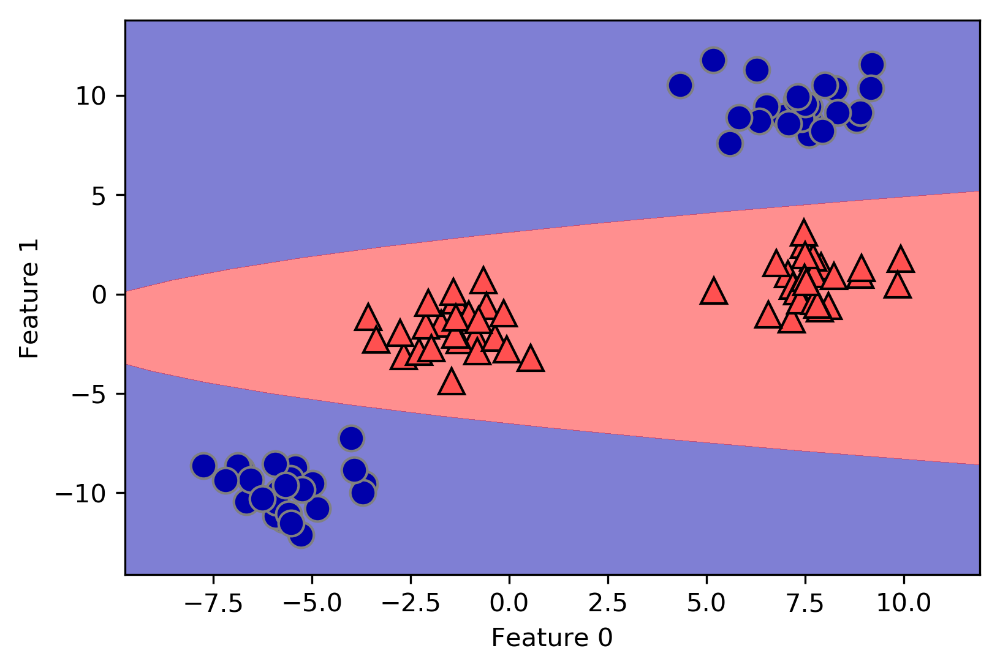

In [97]:
ZZ = YY ** 2
dec = linear_svm_3d.decision_function(np.c_[XX.ravel(), YY.ravel(), ZZ.ravel()])
plt.contourf(XX, YY, dec.reshape(XX.shape), levels=[dec.min(), 0, dec.max()], cmap=mglearn.cm2, alpha=0.5)
mglearn.discrete_scatter(X[:, 0], X[:, 1], y)
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")

#### The Kernel Trick
- 원본 데이터 특성에 비선형 특성을 추가하여 선형모델을 강력하게 만드는 방법의 단점
  - 어떤 특성을 선택하여 비선형 특성을 만들지 선택해야 하는 문제 발생
  - 많은 비선형 특성 추가에 따른 연산 비용 증가
- Kernel Trick (커널 기법)
  - 실제로 데이터 특성을 확장하지 않고, 확장된 특성에 대한 데이터 포인트들의 거리를 계산
  - 커널의 종류
    - 다항식 커널
      - 모든 원본 데이터 특성들에 대하여 가능한 조합을 지정된 차수까지 모두 계산
        - 예: $특성1^2 \times 특성2^5$
    - RBF (Radial Basis Function) or Gaussian (가우시안)
      - 모든 원본 데이터 특성을 무한한 특성 공간에 매핑
      - 즉, 모든 차수의 모든 다항식을 고려
        - 일반적으로 고차항이 될 수록 특성의 중요도는 떨어지게됨
<br/>
<br/>

#### Understanding SVMs
- Support Vectors
  - 주어진 훈련 데이터들 중 두 클래스 사이의 경계에 위치한 데이터 포인트들 --> 결정 경계를 만드는데 영향을 주는 포인트들
  - RBF 커널 (가우시안 커널) 에서의 데이터 포인트 $x_1$과 $x_2$ 사이 거리
    - $k_{rbf}(x_1, x_2 )=exp(-\gamma||x_1 - x_2 ||^2 )$
    - $\gamma$ : 가우시안 커널의 폭을 제어하는 매개변수

[[  8.106   4.287]
 [  9.502   1.938]
 [ 11.564   1.339]
 [ 10.24    2.455]
 [  7.998   4.853]]
[[-10.     -6.252  -3.734  10.      9.986]]


Text(0,0.5,'Feature 1')

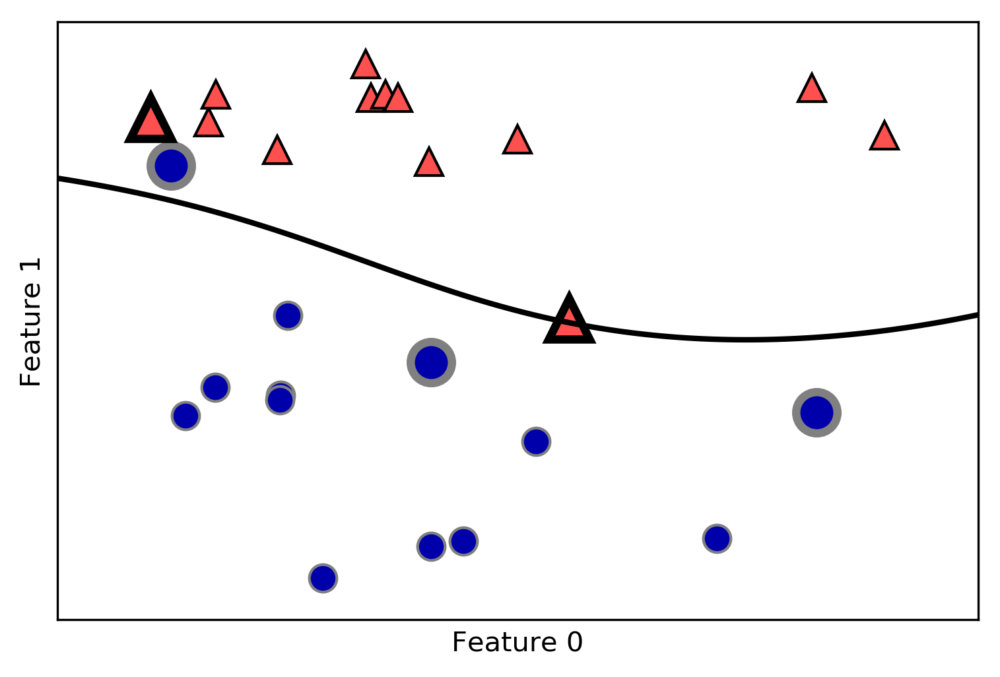

In [98]:
from sklearn.svm import SVC

X, y = mglearn.tools.make_handcrafted_dataset()                                                                  
svm = SVC(kernel='rbf', C=10, gamma=0.1).fit(X, y)
mglearn.plots.plot_2d_separator(svm, X, eps=.5)
mglearn.discrete_scatter(X[:, 0], X[:, 1], y)

# plot support vectors
sv = svm.support_vectors_
dual_coef = svm.dual_coef_
print(sv)
print(dual_coef)
# class labels of support vectors are given by the sign of the dual coefficients
sv_labels = dual_coef.ravel() > 0
mglearn.discrete_scatter(sv[:, 0], sv[:, 1], sv_labels, s=15, markeredgewidth=3)
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")

#### Tuning SVM parameters
- SVC(kernel='rbf', C=10, gamma=0.1) 에서 각 매개변수 튜닝
  - gamma
    - 가우시안 커널 폭($\gamma$)의 역수
    - 훈련 샘플 데이터가 미치는 영향의 범위 결정
    - gamma값이 커짐 -->  $\gamma$이 작아짐 --> 가우시안 커널의 반경이 작아짐 --> 모델의 복잡도가 높아짐
    - gamma값이 작아짐 -->  $\gamma$이 커짐 --> 가우시안 커널의 반경이 커짐 --> 모델의 복잡도가 낮아짐
  - C (Regulation, 규제 변수)
    - C가 커짐 --> 샘플 데이터의 자유도가 작아짐 (제약이 작아짐) --> 샘플 데이터가 모델에 많은 영향을 줌 --> 모델의 복잡도가 높아짐
    - C가 작아짐 --> 샘플 데이터의 자유도가 커짐 (제약이 커짐) --> 샘플 데이터가 모델에 적은 영향을 줌 --> 모델의 복잡도가 낮아짐

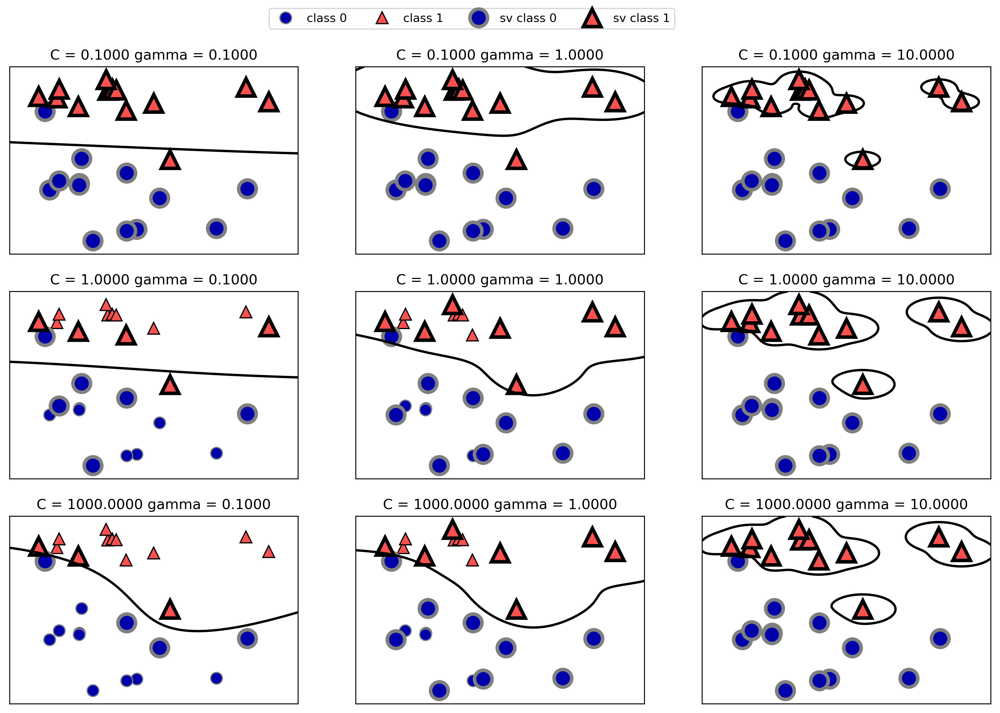

In [99]:
fig, axes = plt.subplots(3, 3, figsize=(15, 10))

for ax, C in zip(axes, [-1, 0, 3]):
    for a, gamma in zip(ax, range(-1, 2)):
        mglearn.plots.plot_svm(log_C=C, log_gamma=gamma, ax=a)
        
axes[0, 0].legend(["class 0", "class 1", "sv class 0", "sv class 1"],
                  ncol=4, loc=(.9, 1.2))

In [100]:
X_train, X_test, y_train, y_test = train_test_split(
    cancer.data, cancer.target, random_state=0)

svc = SVC()
svc.fit(X_train, y_train)

print("Accuracy on training set: {:.2f}".format(svc.score(X_train, y_train)))
print("Accuracy on test set: {:.2f}".format(svc.score(X_test, y_test)))

Accuracy on training set: 1.00
Accuracy on test set: 0.63


Text(0,0.5,'Feature magnitude')

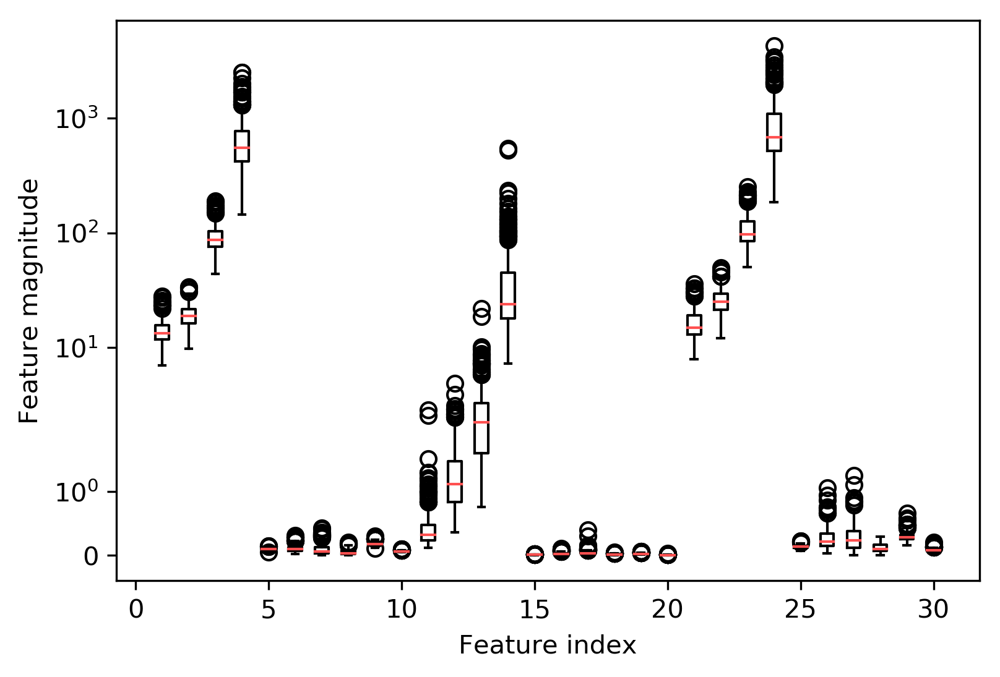

In [101]:
plt.boxplot(X_train, manage_xticks=False)
plt.yscale("symlog")
plt.xlabel("Feature index")
plt.ylabel("Feature magnitude")

##### Preprocessing data for SVMs

- SVM에서는 특히 각 특성값의 범위가 비슷해지도록 정규화하는 것 매우 중요
- 정규화 식
$$\frac{X-min(X)}{max(X)-min(X)}$$

In [102]:
# Compute the minimum value per feature on the training set
min_on_training = X_train.min(axis=0)
# Compute the range of each feature (max - min) on the training set
range_on_training = (X_train - min_on_training).max(axis=0)

# subtract the min, divide by range
# afterward, min=0 and max=1 for each feature
X_train_scaled = (X_train - min_on_training) / range_on_training
print("Minimum for each feature\n{}".format(X_train_scaled.min(axis=0)))
print("Maximum for each feature\n {}".format(X_train_scaled.max(axis=0)))

Minimum for each feature
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Maximum for each feature
 [ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]


- [NOTE] 테스트 데이터 세트에 대해서도 동일한 정규화를 하지만, 훈련 데이터 세트에서 계산된 최소값과 최대값과 해당 범위를 사용

In [103]:
# use THE SAME transformation on the test set,
# using min and range of the training set. See Chapter 3 (unsupervised learning) for details.
X_test_scaled = (X_test - min_on_training) / range_on_training

In [104]:
svc = SVC()
svc.fit(X_train_scaled, y_train)

print("Accuracy on training set: {:.3f}".format(
        svc.score(X_train_scaled, y_train)))
print("Accuracy on test set: {:.3f}".format(svc.score(X_test_scaled, y_test)))

Accuracy on training set: 0.948
Accuracy on test set: 0.951


In [105]:
svc = SVC(C=1000)
svc.fit(X_train_scaled, y_train)

print("Accuracy on training set: {:.3f}".format(
    svc.score(X_train_scaled, y_train)))
print("Accuracy on test set: {:.3f}".format(svc.score(X_test_scaled, y_test)))

Accuracy on training set: 0.988
Accuracy on test set: 0.972


#### Strengths, weaknesses and parameters
- SVM 장점
  - 다양한 데이터셋에 대해서도 잘 작동하는 강력한 모델
  - 데이터의 특성이 몇 개 되지 않더라도 복잡한 결정 경계 생성 가능
- SVM 단점
  - 샘플 데이터 개수가 너무 많을 때 성능이 오히려 떨어질 수 있음
  - 데이터 전처리와 매개변수 설정에 신경을 많이 써야 함

### 2.3.8 Neural Networks (Deep Learning)
#### The Neural Network Model

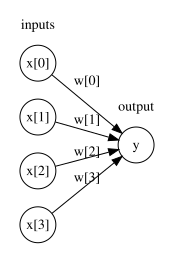

In [106]:
display(mglearn.plots.plot_logistic_regression_graph())

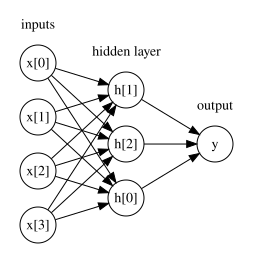

In [107]:
display(mglearn.plots.plot_single_hidden_layer_graph())

Text(0,0.5,'relu(x), tanh(x)')

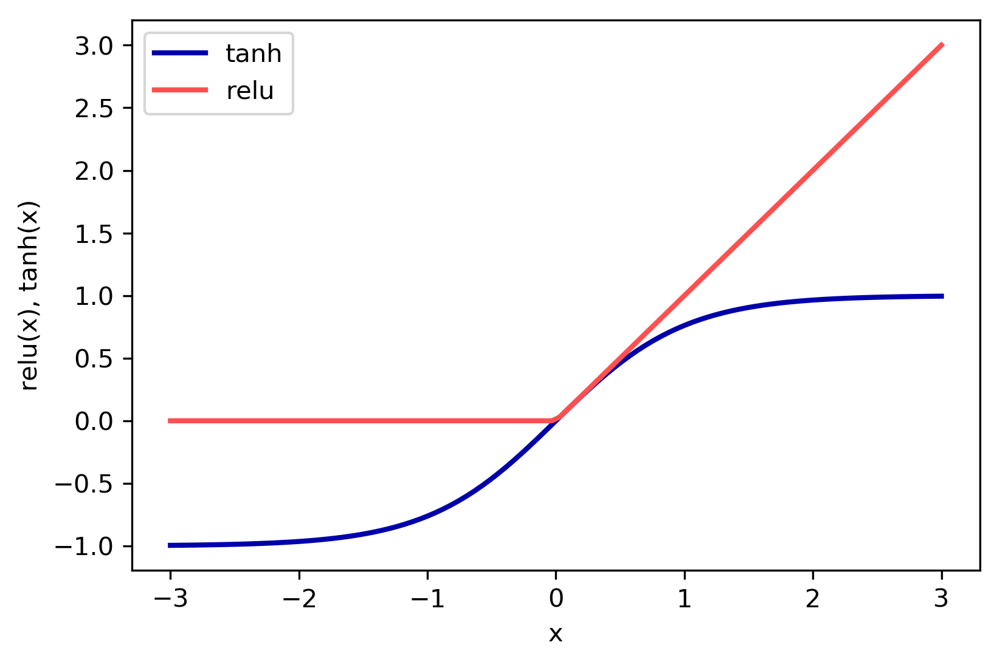

In [108]:
line = np.linspace(-3, 3, 100)
plt.plot(line, np.tanh(line), label="tanh")
plt.plot(line, np.maximum(line, 0), label="relu")
plt.legend(loc="best")
plt.xlabel("x")
plt.ylabel("relu(x), tanh(x)")

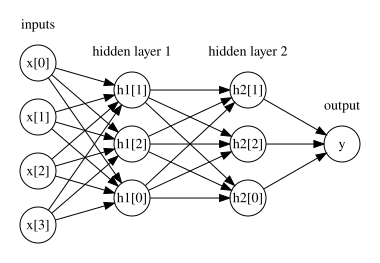

In [109]:
mglearn.plots.plot_two_hidden_layer_graph()

#### Tuning Neural Networks
- MLPClassifier(solver='lbfgs', random_state=0, hidden_layer_sizes=(100, ), activation='tanh')
  - hidden_layer_sizes 매개변수가 없을 때 기본적인 신경망 구조
    - 기본: hidden layer 1개
    - 기본: hidden unit 개수: 100개
    - hidden_layer_sizes=(10, 10)
      - hidden layer 2개
      - hidden layer unit 수 - 각 층마다 10개씩
  - activation
    - 기본값: relu
    - tanh
  - solver (=optimizer)
    - 기본값: adam
      - 데이터의 스케일에 민감 --> 정규화 (평균 0, 분산 1) 중요
    - lbfgs
      - an optimizer in the family of quasi-Newton methods
      - 대부분의 경우 안정적
      - 대량의 데이터에 대한 많은 연산 필요
    - sgd
      - momentum 및 nesterov_momentum 매개변수 지정 필요
      - momentum
        - 새롭게 계산된 그레디언트에 대해 momentum 매개변수에 지정된 비율만큼만 반영 --> 관성 적용
      - nesterov_momentum
        - momentum 방식으로 구한 그레디언트를 이전 그레디언트로 가정
        - 한번 더 momentum 방식을 적용하여 새로운 그레디언트 계산
  - batch_size : int, optional, default ‘auto’
    - Size of minibatches for stochastic optimizers. 
    - If the solver is ‘lbfgs’, the classifier will not use minibatch. 
    - When set to “auto”, batch_size=min(200, n_samples)

Text(0,0.5,'Feature 1')

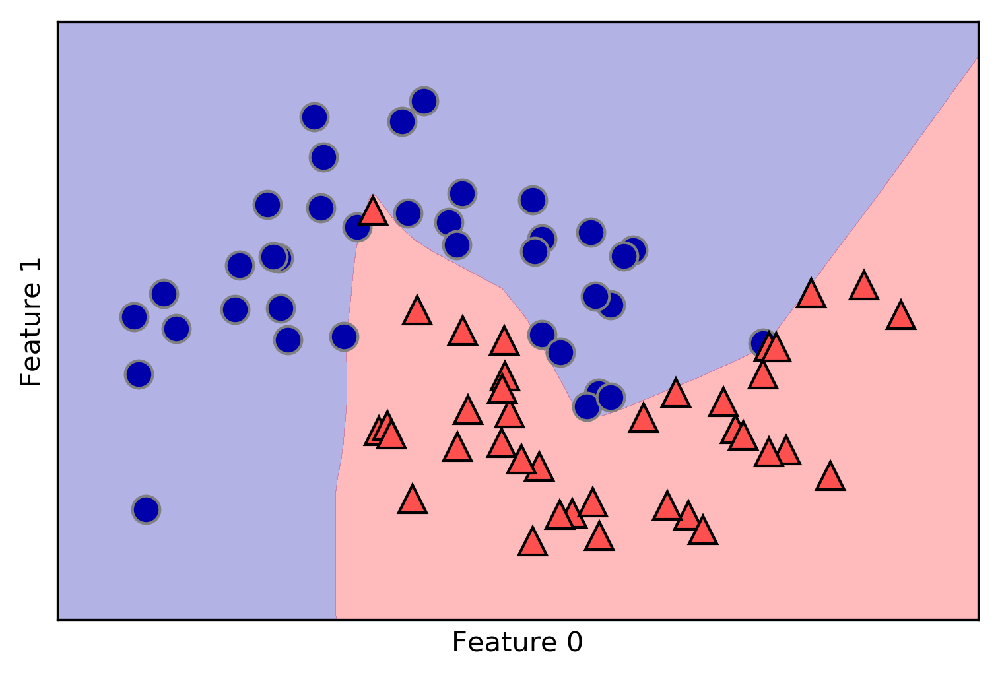

In [110]:
from sklearn.neural_network import MLPClassifier
from sklearn.datasets import make_moons

X, y = make_moons(n_samples=100, noise=0.25, random_state=3)

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=42)

mlp = MLPClassifier(solver='lbfgs', random_state=0).fit(X_train, y_train)
mglearn.plots.plot_2d_separator(mlp, X_train, fill=True, alpha=.3)
mglearn.discrete_scatter(X_train[:, 0], X_train[:, 1], y_train)
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")

Text(0,0.5,'Feature 1')

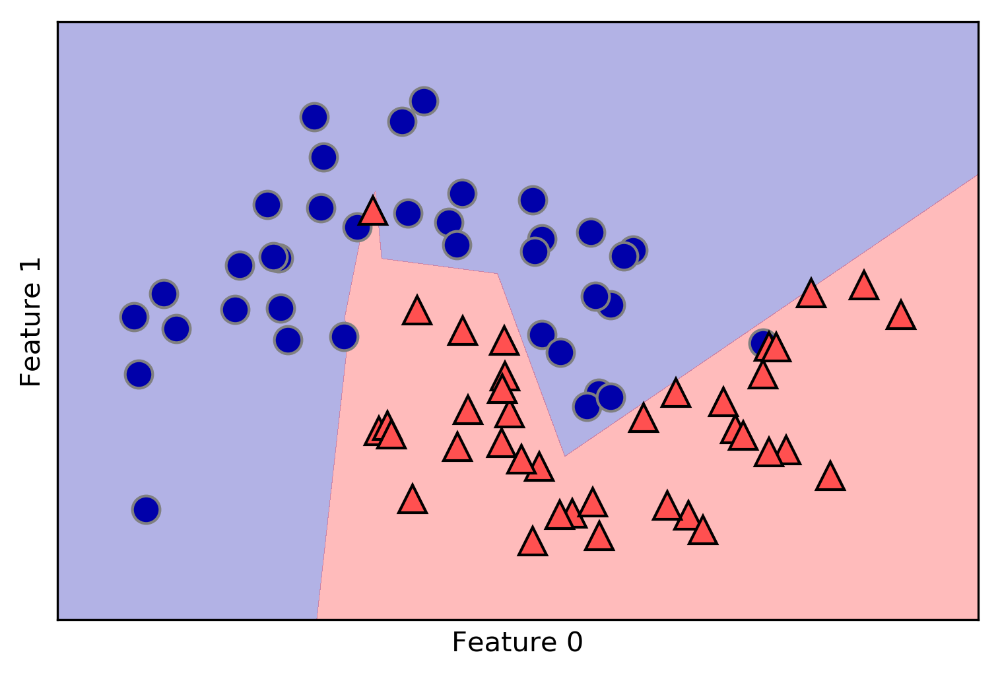

In [111]:
mlp = MLPClassifier(solver='lbfgs', random_state=0, hidden_layer_sizes=[10])
mlp.fit(X_train, y_train)
mglearn.plots.plot_2d_separator(mlp, X_train, fill=True, alpha=.3)
mglearn.discrete_scatter(X_train[:, 0], X_train[:, 1], y_train)
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")

Text(0,0.5,'Feature 1')

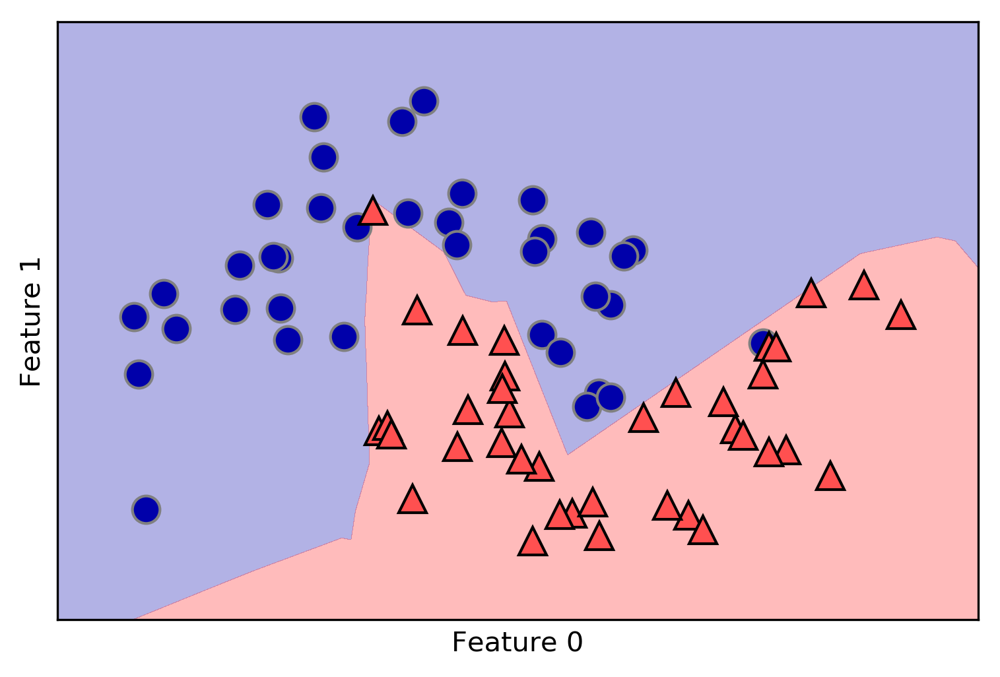

In [112]:
# using two hidden layers, with 10 units each
mlp = MLPClassifier(solver='lbfgs', random_state=0, hidden_layer_sizes=[10, 10])
mlp.fit(X_train, y_train)
mglearn.plots.plot_2d_separator(mlp, X_train, fill=True, alpha=.3)
mglearn.discrete_scatter(X_train[:, 0], X_train[:, 1], y_train)
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")

Text(0,0.5,'Feature 1')

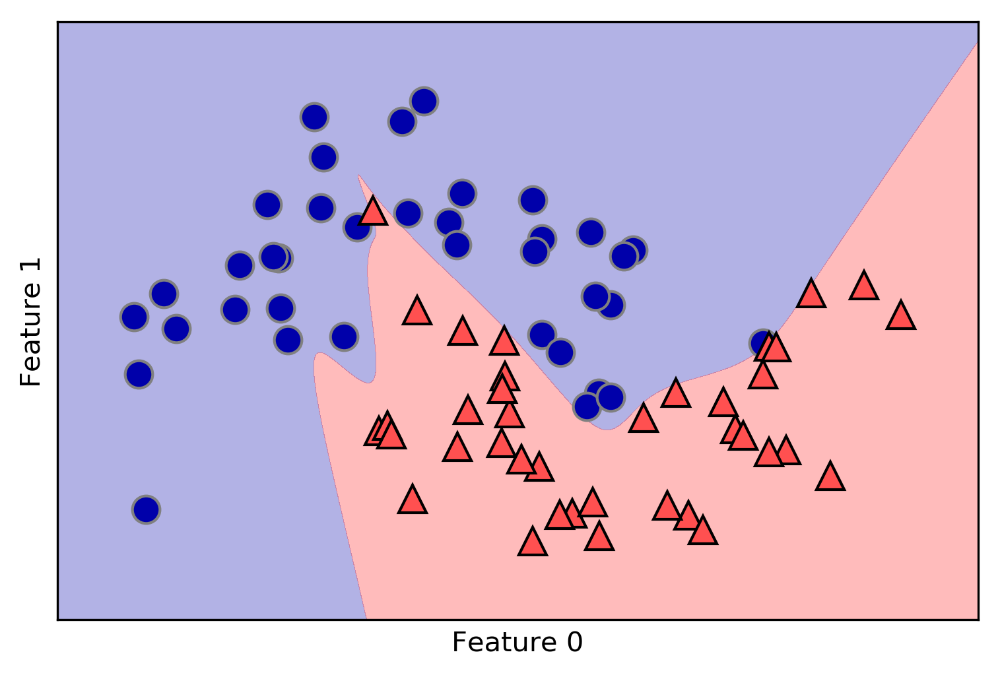

In [113]:
# using two hidden layers, with 10 units each, now with tanh nonlinearity.
mlp = MLPClassifier(solver='lbfgs', activation='tanh', random_state=0, hidden_layer_sizes=[10, 10])
mlp.fit(X_train, y_train)
mglearn.plots.plot_2d_separator(mlp, X_train, fill=True, alpha=.3)
mglearn.discrete_scatter(X_train[:, 0], X_train[:, 1], y_train)
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")

- L2 규제 사용
  - alpha 매개변수 사용
    - 기본값: 0.00001

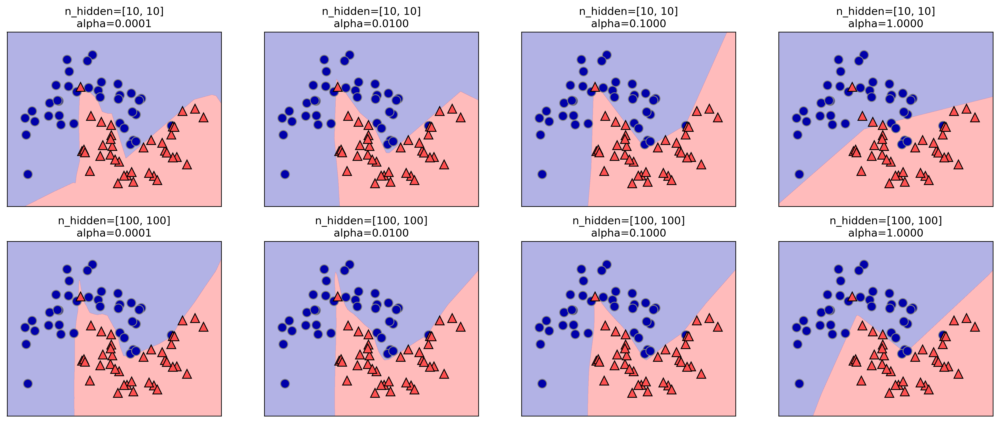

In [114]:
fig, axes = plt.subplots(2, 4, figsize=(20, 8))
for axx, n_hidden_nodes in zip(axes, [10, 100]):
    for ax, alpha in zip(axx, [0.0001, 0.01, 0.1, 1]):
        mlp = MLPClassifier(solver='lbfgs', random_state=0, hidden_layer_sizes=[n_hidden_nodes, n_hidden_nodes],
                            alpha=alpha)
        mlp.fit(X_train, y_train)
        mglearn.plots.plot_2d_separator(mlp, X_train, fill=True, alpha=.3, ax=ax)
        mglearn.discrete_scatter(X_train[:, 0], X_train[:, 1], y_train, ax=ax)
        ax.set_title("n_hidden=[{}, {}]\nalpha={:.4f}".format(n_hidden_nodes, n_hidden_nodes, alpha))

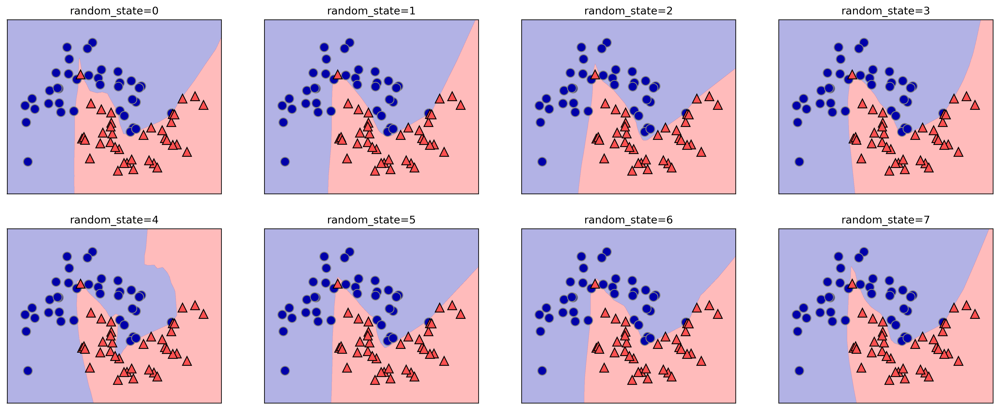

In [115]:
fig, axes = plt.subplots(2, 4, figsize=(20, 8))
for i, ax in enumerate(axes.ravel()):
    mlp = MLPClassifier(solver='lbfgs', random_state=i, hidden_layer_sizes=[100, 100])
    mlp.fit(X_train, y_train)
    mglearn.plots.plot_2d_separator(mlp, X_train, fill=True, alpha=.3, ax=ax)
    mglearn.discrete_scatter(X_train[:, 0], X_train[:, 1], y_train, ax=ax)
    ax.set_title("random_state={}".format(i))

In [116]:
print("Cancer data per-feature maxima:\n{}".format(cancer.data.max(axis=0)))

Cancer data per-feature maxima:
[   28.11     39.28    188.5    2501.        0.163     0.345     0.427
     0.201     0.304     0.097     2.873     4.885    21.98    542.2
     0.031     0.135     0.396     0.053     0.079     0.03     36.04
    49.54    251.2    4254.        0.223     1.058     1.252     0.291
     0.664     0.207]


In [117]:
X_train, X_test, y_train, y_test = train_test_split(cancer.data, cancer.target, random_state=0)

mlp = MLPClassifier(random_state=42)
mlp.fit(X_train, y_train)

print("Accuracy on training set: {:.2f}".format(mlp.score(X_train, y_train)))
print("Accuracy on test set: {:.2f}".format(mlp.score(X_test, y_test)))

Accuracy on training set: 0.91
Accuracy on test set: 0.88


- 유방암 데이터에 대한 정규화

In [118]:
# compute the mean value per feature on the training set
mean_on_train = X_train.mean(axis=0)
# compute the standard deviation of each feature on the training set
std_on_train = X_train.std(axis=0)

# subtract the mean, and scale by inverse standard deviation
# afterward, mean=0 and std=1
X_train_scaled = (X_train - mean_on_train) / std_on_train
# use THE SAME transformation (using training mean and std) on the test set
X_test_scaled = (X_test - mean_on_train) / std_on_train

mlp = MLPClassifier(random_state=0)
mlp.fit(X_train_scaled, y_train)

print("Accuracy on training set: {:.3f}".format(mlp.score(X_train_scaled, y_train)))
print("Accuracy on test set: {:.3f}".format(mlp.score(X_test_scaled, y_test)))

Accuracy on training set: 0.991
Accuracy on test set: 0.965


/Users/yhhan/anaconda3/lib/python3.6/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


- adam optimizer에서 200번 정도의 iteration으로는 converge 시키기 부족함 --> max_iter 값 증가 필요

In [119]:
mlp = MLPClassifier(max_iter=1000, random_state=0)
mlp.fit(X_train_scaled, y_train)

print("Accuracy on training set: {:.3f}".format(mlp.score(X_train_scaled, y_train)))
print("Accuracy on test set: {:.3f}".format(mlp.score(X_test_scaled, y_test)))

Accuracy on training set: 0.993
Accuracy on test set: 0.972


- L2 규제 (일반화 성능 증대)
  - alpha = 1.0

In [120]:
mlp = MLPClassifier(max_iter=1000, alpha=1.0, random_state=0)
mlp.fit(X_train_scaled, y_train)

print("Accuracy on training set: {:.3f}".format(mlp.score(X_train_scaled, y_train)))
print("Accuracy on test set: {:.3f}".format(mlp.score(X_test_scaled, y_test)))

Accuracy on training set: 0.988
Accuracy on test set: 0.972


- 입력과 첫번째 hidden layer 사이의 학습된 가중치 값 시각화
  - 작은 가중치를 지닌 특성이 덜 중요하다고 해석 가능

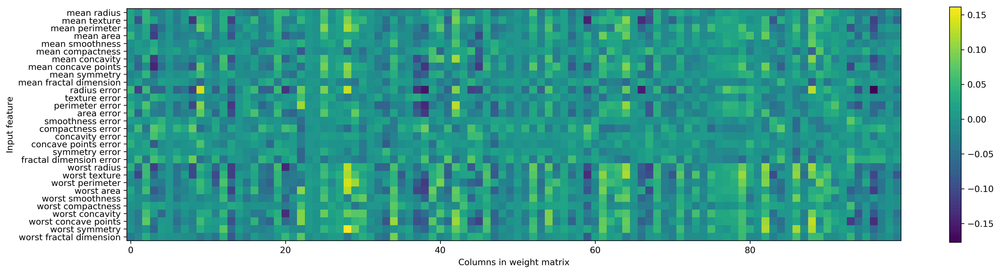

In [121]:
plt.figure(figsize=(20, 5))
plt.imshow(mlp.coefs_[0], interpolation='none', cmap='viridis')
plt.yticks(range(30), cancer.feature_names)
plt.xlabel("Columns in weight matrix")
plt.ylabel("Input feature")
plt.colorbar()

#### Strengths, weaknesses and parameters
- MLPClassifier의 한계
  - CNN, RNN 등의 복잡한 딥러닝 신경망 구성할 수 없음
    - scikit-learn 에서는 아직 CNN과 RNN을 지원하지 않음 
  - 이러한 복잡한 딥러닝 신경망 구성은 keras 또는 tensorflow 활용 필요함
- 신경망의 장점
  - 많은 응용에서 최고의 모델로 평가받고 있음
  - 대량의 데이터에 내재된 정보를 잡아내면서 복잡한 모델 구성 가능
  - 충분한 연산 시간과 데이터를 주고 매개변수를 세심하게 조정하면 최고의 성능 발휘 가능
- 신견망의 단점
  - 학습 시간이 오래 걸림
  - 데이터 전처리 중요
    - 모든 특성이 동일한 범위를 지닌 데이터에 잘 작동

#### Estimating complexity in neural networks
- 일반적인 학습 모델 구성 방법
  - 처음에는 한 개 또는 두 개의 은닉층으로 시작하면서 은닉층의 수를 늘려나감
  - 각 은닉층의 유닛의 개수는 보통 입력 틍성의 수와 비슷하게 설정
  - 일단 충분히 과대적합이 될 정도로 큰 신경망 모델을 구성
  - 이후 alpha 값을 증가시키며 규제(Regularization)의 강도를 높힘
  
- 모델 구성 요성
  - 층의 개수
  - 층당 유닛 개수
  - 가중치 초기값
  - 규제의 강도
  - 비활성화 함수 (relu, tanh, ...)
  - 학습 알고리즘 (즉, solver)
    - adam, sgd, lbfgs

### 2.4 Uncertainty estimates from classifiers
- 불확실성 추정
  - 분류모델이 예측한 분류 클래스가 얼마나 정확한 지 판단 필요
  - 예를 들어, 암진단 응용에서 거짓 양성(False Positive) 분류는 환자에게 추가 진료를 요구하겠지만, 거짓 음성(False Negative) 분류는 심각한 질병을 치료하지 못하게 할 수 있음.
<br/>
- scikit-learn에서 제공하는 불확실성 추정 함수
  - decision_function
  - predict_prob

In [143]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.datasets import make_circles

X, y = make_circles(noise=0.25, factor=0.5, random_state=1)

print("Data shape: {}".format(X.shape))
print("Target shape: {}".format(y.shape))

print()

# we rename the classes "blue" and "red" for illustration bpurposes:
y_named = np.array(["blue", "red"])[y]
print("Named Target shape: {}".format(y_named.shape))
print(y[0], y_named[0])
print(y[1], y_named[1])
print(y[2], y_named[2])

Data shape: (100, 2)
Target shape: (100,)

Named Target shape: (100,)
1 red
1 red
0 blue


In [144]:
# we can call train_test_split with arbitrarily many arrays;
# all will be split in a consistent manner
X_train, X_test, y_train_named, y_test_named, y_train, y_test = train_test_split(X, y_named, y, random_state=0)

# build the gradient boosting model
gbrt = GradientBoostingClassifier(random_state=0)
gbrt.fit(X_train, y_train_named)

GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=100,
              presort='auto', random_state=0, subsample=1.0, verbose=0,
              warm_start=False)

#### 2.4.1 The Decision Function
- decision_function 반환값
  - 주어진 데이터 포인트 샘플당 하나의 실수값 반환
  - 주어진 데이터 포인트가 양성 클래스인 1에 속한다고 믿는 정도
  - 반환값의 부호
    - 양수: 양성 클래스 (1)
    - 음수: 음성 클래스 (0)

In [145]:
print("X_test.shape: {}".format(X_test.shape))

print()

print("Decision function shape: {}".format(gbrt.decision_function(X_test).shape))

print()

print("Decision function:\n{}".format(gbrt.decision_function(X_test)))

X_test.shape: (25, 2)

Decision function shape: (25,)

Decision function:
[ 4.136 -1.702 -3.951 -3.626  4.29   3.662 -7.691  4.11   1.108  3.408
 -6.463  4.29   3.902 -1.2    3.662 -4.172 -1.23  -3.916  4.036  4.11   4.11
  0.657  2.698 -2.657 -1.868]


In [146]:
print("Thresholded decision function:\n{}".format(gbrt.decision_function(X_test) > 0))
print("Predictions:\n{}".format(gbrt.predict(X_test)))

Thresholded decision function:
[ True False False False  True  True False  True  True  True False  True
  True False  True False False False  True  True  True  True  True False
 False]
Predictions:
['red' 'blue' 'blue' 'blue' 'red' 'red' 'blue' 'red' 'red' 'red' 'blue'
 'red' 'red' 'blue' 'red' 'blue' 'blue' 'blue' 'red' 'red' 'red' 'red'
 'red' 'blue' 'blue']


In [150]:
# make the boolean True/False into 0 and 1
greater_zero = (gbrt.decision_function(X_test) > 0).astype(int)
print(greater_zero)
print()

# use 0 and 1 as indices into classes_
print(gbrt.classes_)
pred = gbrt.classes_[greater_zero]

print(pred)

print()

# pred is the same as the output of gbrt.predict
print("pred is equal to predictions: {}".format(np.all(pred == gbrt.predict(X_test))))

[1 0 0 0 1 1 0 1 1 1 0 1 1 0 1 0 0 0 1 1 1 1 1 0 0]

['blue' 'red']
['red' 'blue' 'blue' 'blue' 'red' 'red' 'blue' 'red' 'red' 'red' 'blue'
 'red' 'red' 'blue' 'red' 'blue' 'blue' 'blue' 'red' 'red' 'red' 'red'
 'red' 'blue' 'blue']

pred is equal to predictions: True


In [151]:
decision_function = gbrt.decision_function(X_test)
print("Decision function minimum: {:.2f} maximum: {:.2f}".format(np.min(decision_function), np.max(decision_function)))

Decision function minimum: -7.69 maximum: 4.29


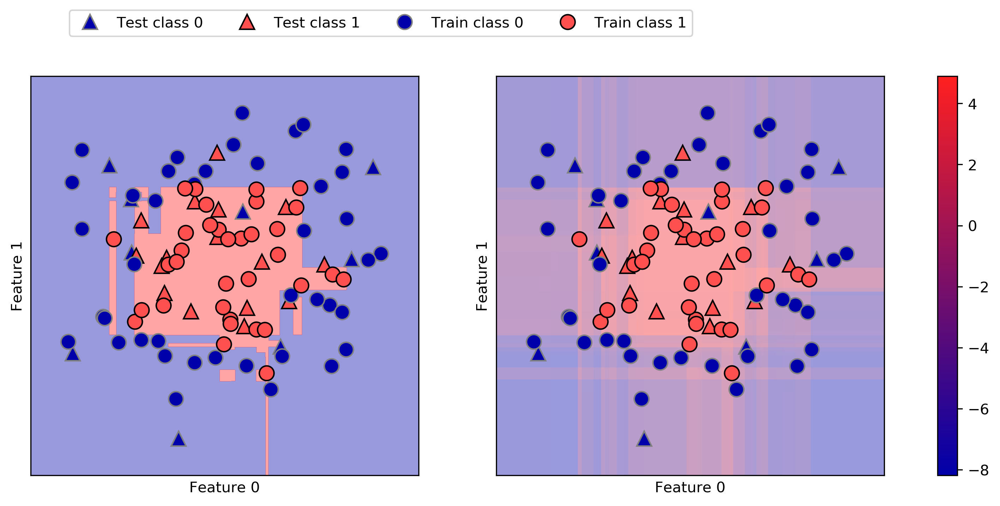

In [152]:
fig, axes = plt.subplots(1, 2, figsize=(13, 5))
mglearn.tools.plot_2d_separator(gbrt, X, ax=axes[0], alpha=.4, fill=True, cm=mglearn.cm2)
scores_image = mglearn.tools.plot_2d_scores(gbrt, X, ax=axes[1], alpha=.4, cm=mglearn.ReBl)

for ax in axes:
    # plot training and test points
    mglearn.discrete_scatter(X_test[:, 0], X_test[:, 1], y_test, markers='^', ax=ax)
    mglearn.discrete_scatter(X_train[:, 0], X_train[:, 1], y_train, markers='o', ax=ax)
    ax.set_xlabel("Feature 0")
    ax.set_ylabel("Feature 1")
cbar = plt.colorbar(scores_image, ax=axes.tolist())
cbar.set_alpha(1)
cbar.draw_all()
axes[0].legend(["Test class 0", "Test class 1", "Train class 0", "Train class 1"], ncol=4, loc=(.1, 1.1))

- 왼쪽 그래프: 결정 경계
- 오른쪽 그래프: decision_function의 값을 색으로 표현

#### 2.4.2 Predicting Probabilities
- predict_proba
  - 각 분류 클래스에 대한 확률값 반환
  - 반환값의 shape는 항상 (n_samples, 2)
    - 각 샘플당 첫번째 원소는 첫번째 클래스의 예측 확률, 두번째 원소는 두번째 클래스의 예측 확률
    - 두 원소 값의 합은 항상 1.0
  - overfitting 된 복잡도가 높은 모델에서는 각 클래스에 대한 예측 확실성이 높음 (즉, 예측 확신이 강함)
  - 일반적으로 복잡도가 낮은 모델은 예측에 대한 불확실성이 높음 (즉, 예측 확신이 약함)
- 불확실의 정도와 모델의 정확도가 동일 --> 보정(Calibration)이 잘 되었다고 판단
  - 보정이 잘 된 모델에서 70% 확신을 지닌 예측은 70%의 정확도를 냄

In [153]:
print("Shape of probabilities: {}".format(gbrt.predict_proba(X_test).shape))

print()

# show the first few entries of predict_proba
print("Predicted probabilities:\n{}".format(gbrt.predict_proba(X_test)))

Shape of probabilities: (25, 2)

Predicted probabilities:
[[ 0.016  0.984]
 [ 0.846  0.154]
 [ 0.981  0.019]
 [ 0.974  0.026]
 [ 0.014  0.986]
 [ 0.025  0.975]
 [ 1.     0.   ]
 [ 0.016  0.984]
 [ 0.248  0.752]
 [ 0.032  0.968]
 [ 0.998  0.002]
 [ 0.014  0.986]
 [ 0.02   0.98 ]
 [ 0.769  0.231]
 [ 0.025  0.975]
 [ 0.985  0.015]
 [ 0.774  0.226]
 [ 0.98   0.02 ]
 [ 0.017  0.983]
 [ 0.016  0.984]
 [ 0.016  0.984]
 [ 0.341  0.659]
 [ 0.063  0.937]
 [ 0.934  0.066]
 [ 0.866  0.134]]


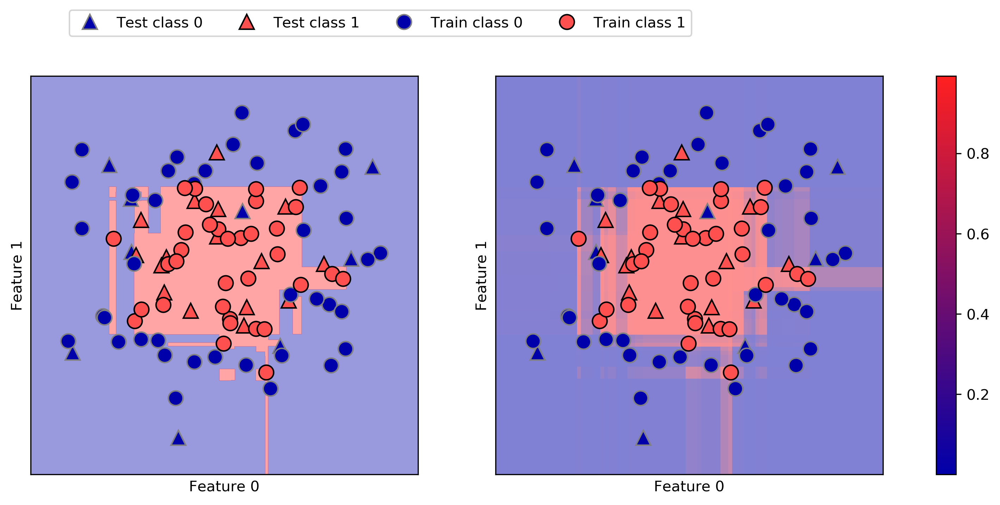

In [132]:
fig, axes = plt.subplots(1, 2, figsize=(13, 5))
    
mglearn.tools.plot_2d_separator(gbrt, X, ax=axes[0], alpha=.4, fill=True, cm=mglearn.cm2)
scores_image = mglearn.tools.plot_2d_scores(gbrt, X, ax=axes[1], alpha=.5, cm=mglearn.ReBl, function='predict_proba')

for ax in axes:
    # plot training and test points
    mglearn.discrete_scatter(X_test[:, 0], X_test[:, 1], y_test, markers='^', ax=ax)
    mglearn.discrete_scatter(X_train[:, 0], X_train[:, 1], y_train, markers='o', ax=ax)
    ax.set_xlabel("Feature 0")
    ax.set_ylabel("Feature 1")
# don't want a transparent colorbar
cbar = plt.colorbar(scores_image, ax=axes.tolist())
cbar.set_alpha(1)
cbar.draw_all()
axes[0].legend(["Test class 0", "Test class 1", "Train class 0", "Train class 1"], ncol=4, loc=(.1, 1.1))

- 많은 모델에 대한 불확실성 추정 도표
  - http://bit.ly/2cqCYx6

![classifier_comparison](images/classifier_comparison.png)

#### 2.4.3 Uncertainty in multi-class classification

In [156]:
from sklearn.datasets import load_iris

iris = load_iris()
X_train, X_test, y_train, y_test = train_test_split(iris.data, iris.target, random_state=42)

gbrt = GradientBoostingClassifier(learning_rate=0.01, random_state=0)
gbrt.fit(X_train, y_train)

GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.01, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=100,
              presort='auto', random_state=0, subsample=1.0, verbose=0,
              warm_start=False)

In [157]:
print("Decision function shape: {}".format(gbrt.decision_function(X_test).shape))
# plot the first few entries of the decision function
print("Decision function:\n{}".format(gbrt.decision_function(X_test)[:6, :]))

Decision function shape: (38, 3)
Decision function:
[[-0.529  1.466 -0.504]
 [ 1.512 -0.496 -0.503]
 [-0.524 -0.468  1.52 ]
 [-0.529  1.466 -0.504]
 [-0.531  1.282  0.215]
 [ 1.512 -0.496 -0.503]]


In [158]:
print("Argmax of decision function:\n{}".format(np.argmax(gbrt.decision_function(X_test), axis=1)))
print("Predictions:\n{}".format(gbrt.predict(X_test)))

Argmax of decision function:
[1 0 2 1 1 0 1 2 1 1 2 0 0 0 0 1 2 1 1 2 0 2 0 2 2 2 2 2 0 0 0 0 1 0 0 2 1
 0]
Predictions:
[1 0 2 1 1 0 1 2 1 1 2 0 0 0 0 1 2 1 1 2 0 2 0 2 2 2 2 2 0 0 0 0 1 0 0 2 1
 0]


In [159]:
# show the first few entries of predict_proba
print("Predicted probabilities:\n{}".format(gbrt.predict_proba(X_test)[:6]))
# show that sums across rows are one
print("Sums: {}".format(gbrt.predict_proba(X_test)[:6].sum(axis=1)))

Predicted probabilities:
[[ 0.107  0.784  0.109]
 [ 0.789  0.106  0.105]
 [ 0.102  0.108  0.789]
 [ 0.107  0.784  0.109]
 [ 0.108  0.663  0.228]
 [ 0.789  0.106  0.105]]
Sums: [ 1.  1.  1.  1.  1.  1.]


In [160]:
print("Argmax of predicted probabilities:\n{}".format(np.argmax(gbrt.predict_proba(X_test), axis=1)))
print("Predictions:\n{}".format(gbrt.predict(X_test)))

Argmax of predicted probabilities:
[1 0 2 1 1 0 1 2 1 1 2 0 0 0 0 1 2 1 1 2 0 2 0 2 2 2 2 2 0 0 0 0 1 0 0 2 1
 0]
Predictions:
[1 0 2 1 1 0 1 2 1 1 2 0 0 0 0 1 2 1 1 2 0 2 0 2 2 2 2 2 0 0 0 0 1 0 0 2 1
 0]


In [163]:
logreg = LogisticRegression()

# represent each target by its class name in the iris dataset
named_target = iris.target_names[y_train]
logreg.fit(X_train, named_target)
print("unique classes in training data: {}".format(logreg.classes_))

print()

print("predictions: {}".format(logreg.predict(X_test)[:10]))

print()

argmax_dec_func = np.argmax(logreg.decision_function(X_test), axis=1)
print("argmax of decision function: {}".format(argmax_dec_func[:10]))

print()

print("argmax combined with classes_: {}".format(logreg.classes_[argmax_dec_func][:10]))

unique classes in training data: ['setosa' 'versicolor' 'virginica']

predictions: ['versicolor' 'setosa' 'virginica' 'versicolor' 'versicolor' 'setosa'
 'versicolor' 'virginica' 'versicolor' 'versicolor']

argmax of decision function: [1 0 2 1 1 0 1 2 1 1]

argmax combined with classes_: ['versicolor' 'setosa' 'virginica' 'versicolor' 'versicolor' 'setosa'
 'versicolor' 'virginica' 'versicolor' 'versicolor']


### 2.5 Summary and Outlook
- 최근접 이웃
- 선형 모델
- 나이브 베이즈
- 결정 트리
- 랜덤 포레스트
- 그레디언트 부스팅 결정 트리
- 서포트 벡터 머신
- 신경망